In [191]:
## This file is part of Jax Geometry
#
# Copyright (C) 2021, Stefan Sommer (sommer@di.ku.dk)
# https://bitbucket.org/stefansommer/jaxgeometry
#
# Jax Geometry is free software: you can redistribute it and/or modify
# it under the terms of the GNU General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.
#
# Jax Geometry is distributed in the hope that it will be useful,
# but WITHOUT ANY WARRANTY; without even the implied warranty of
# MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
# GNU General Public License for more details.
#
# You should have received a copy of the GNU General Public License
# along with Jax Geometry. If not, see <http://www.gnu.org/licenses/>.
#

In [192]:
#Modules

#JAX
import jax.numpy as jnp
from jax import lax

#Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D

#JAXGeometry
from src.manifolds.S2 import *
from src.plotting import *
from IPython.display import clear_output
from src.Riemannian import metric, geodesic
from src.stochastics import Brownian_coords
from src.stochastics import product_sde
from src.stochastics.product_sde import tile

#Neural Networks
import haiku as hk
import optax
import jaxopt
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np

#Own modules
import score_matching as sm

#%matplotlib notebook

# $\mathbb{S}^2$ Sphere Geometry

In [193]:
#Defining manifold
M = S2()
print(M)

2d sphere (ellipsoid parameters [1. 1. 1.], spherical_coords: False)


In [194]:
#Hyper parameters
x0 = M.coords([0.,0.])
max_T = 1.0
T = 0.5

metric.initialize(M)
geodesic.initialize(M)
Brownian_coords.initialize(M)

In [195]:
(product,sde_product,chart_update_product) = product_sde.initialize(M,M.sde_Brownian_coords,
                                                                    M.chart_update_Brownian_coords)

In [196]:
def get_coords(Fx):
    chart = M.centered_chart(Fx)
    return (M.invF((Fx,chart)),chart)

def to_TM(Fx,v):
    x = get_coords(Fx)
#     return jnp.dot(M.JF(x),jnp.dot(M.invJF((Fx,x[1])),v))
    JFx = M.JF(x)
    return jnp.dot(JFx,jnp.linalg.lstsq(JFx,v)[0])

## Simulate Synthetic Data

### Simulating Circle on Sphere

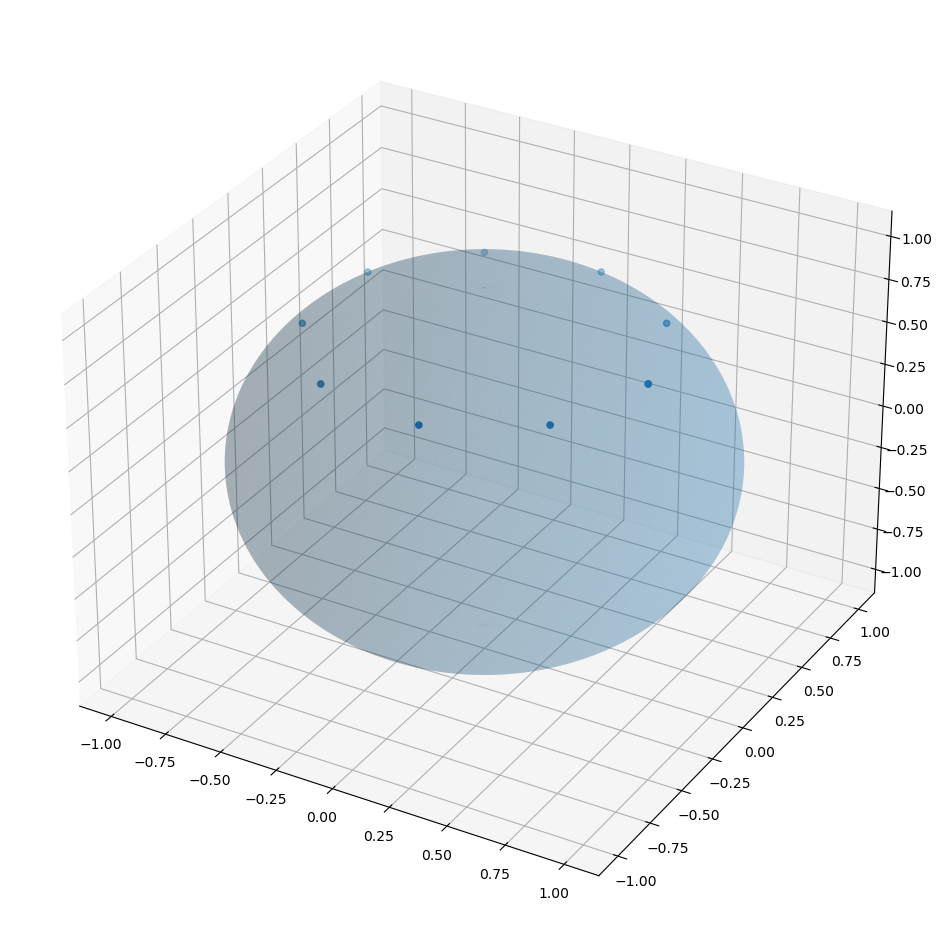

In [197]:
# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))

N_points = 10
theta = jnp.pi/4
phi = jnp.linspace(0.0, jnp.pi*2, N_points)
X1_circle = jnp.sin(theta)*jnp.cos(phi)
X2_circle = jnp.sin(theta)*jnp.sin(phi)
X3_circle = jnp.cos(theta)*jnp.ones(N_points)
X_circle = jnp.concatenate((X1_circle.reshape(1,-1), X2_circle.reshape(1,-1), X3_circle.reshape(1,-1))).T

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.scatter(X1_circle, X2_circle, X3_circle)
plt.show()

### Simulating Brownian Motion on Sphere

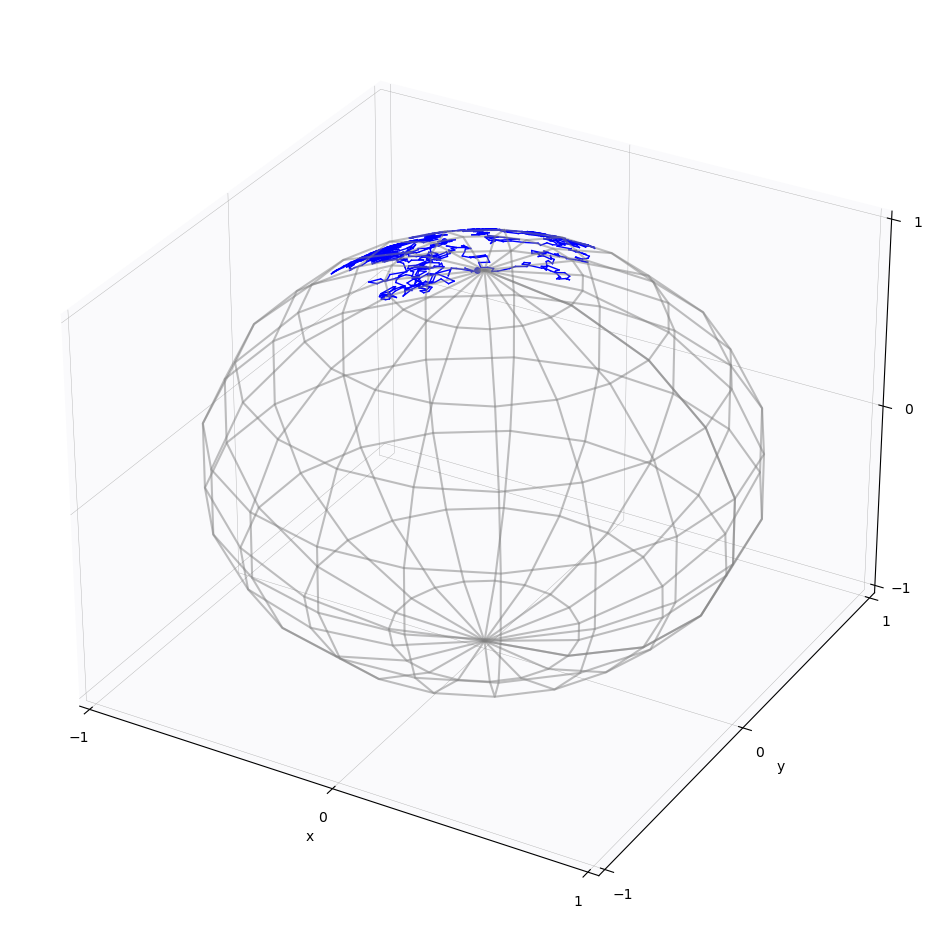

In [198]:
_dts = dts(T = T, n_steps=1000)
(ts,xs,charts) = M.Brownian_coords(x0,_dts,dWs(M.dim,_dts))

X_bm = (xs, charts)

# plot
newfig()
M.plot()
M.plot_path(zip(xs,charts))
plt.show()

## Theoretical Heat Kernel on $\mathbb{S}^2$

The heat kernel for $S^{m}$ is given by

\begin{equation}
    p(x,y,t) = \sum_{l=0}^{\infty} e^{-l(l+m-1)\frac{t}{2}}\frac{2l+m-1}{m-1}\frac{1}{A_{S}^{m}}C_{l}^{(m-1)/2}\left(\langle x, y \rangle_{\mathbb{R}^{m+1}}\right),
\end{equation}

where

\begin{equation}
    A_{S}^{m} = \frac{2\pi^{(m+1)/2}}{\Gamma\left((m+1)/2\right)}
\end{equation}

The gradient of $\log p(x,y,t)$ is then given by

\begin{equation}
    \nabla_{x} \log p(x_{0}, x, t) = \frac{\nabla_{x}p(x_{0}, x, t)}{p(x_{0}, x, t)} \\
\end{equation}

which gives that

\begin{align}
    \nabla_{x} p(x_{0}, x, t) &= \nabla_{x} \sum_{l=0}^{\infty} e^{-l(l+m-1)\frac{t}{2}}\frac{2l+m-1}{m-1}\frac{1}{A_{S}^{m}}C_{l}^{(m-1)/2}\left(\langle x_{0}, x \rangle_{\mathbb{R}^{m+1}}\right) \\ 
    &= \sum_{l=0}^{\infty} e^{-l(l+m-1)\frac{t}{2}}\frac{2l+m-1}{m-1}\frac{1}{A_{S}^{m}}\nabla_{x}C_{l}^{(m-1)/2}\left(\langle x_{0}, x \rangle_{\mathbb{R}^{m+1}}\right) \\
    &= \sum_{l=0}^{\infty} e^{-l(l+m-1)\frac{t}{2}}\frac{2l+m-1}{m-1}\frac{1}{A_{S}^{m}}2\frac{m-1}{2}C_{l-1}^{(m+1)/2}\left(\langle x_{0}, x \rangle_{\mathbb{R}^{m+1}}\right)x_{0} \\
    &= \sum_{l=0}^{\infty} e^{-l(l+m-1)\frac{t}{2}}(2l+m-1)\frac{1}{A_{S}^{m}}C_{l-1}^{(m+1)/2}\left(\langle x_{0}, x \rangle_{\mathbb{R}^{m+1}}\right)x_{0}
\end{align}

where it has been used that $\frac{d}{dx}C_{n}^{\lambda}(x) = 2 \lambda C_{n-1}^{\lambda+1}(x)$. The above is implemented using the recursion

\begin{equation}
    l C_{l}^{(\alpha)}(x) = 2(l-1+\alpha)xC_{l-1}^{(\alpha)}-(n+2\alpha-2)C_{l-2}^{(\alpha)}(x).
\end{equation}

In [199]:
def trapezoidal(func, grid):
    
    def trapezoidal_step(carry, grid_vals):
        
        val, f_prev = carry
        t, dt = grid_vals
        
        f_up = func(t)
        val += (f_prev+f_up)*dt
        
        return (val, f_up), None
    
    dt_grid = jnp.diff(grid)
    t0 = grid[0]
    new_grid = grid[1:]
    
    yT, _ = lax.scan(trapezoidal_step, (0.0, func(t0)), xs=(new_grid, dt_grid))
    yT = yT[0]*0.5
    
    return yT

def gamma_fun(x, T=100, N=1000, eps=1e-10):
    
    fun = lambda t: t**(x-1)*jnp.exp(-t)
    grid = jnp.linspace(eps+0.0, T, N)
    
    return trapezoidal(fun, grid)

In [200]:
def p_sm(x,y,t, m=2, N=20):
    
    #Heat kernel on sphere
    
    def sum_term(l, C_l):
        
        return jnp.exp(-0.5*l*(l+m1)*t)*(2*l+m1)*C_l
    
    def update_cl(l, Cl1, Cl2):
        
        return (2*(l-1+alpha)*xy_dot*Cl1-(l+2*alpha-2)*Cl2)/l
    
    def step(carry, l):

        val, Cl1, Cl2 = carry

        C_l = update_cl(l, Cl1, Cl2)

        val += sum_term(l, C_l)

        return (val, C_l, Cl1), None

    Am_inv = gamma_fun((m+1)*0.5)/(2*jnp.pi**((m+1)*0.5))
    m1 = m-1
    xy_dot = jnp.dot(x,y)
    
    alpha = m1*0.5
    C_0 = 1.0
    C_1 = 2*alpha*xy_dot
    
    val = sum_term(0, C_0) + sum_term(1, C_1)
    
    grid = jnp.arange(2,N,1)
    
    val, _ = lax.scan(step, (val, C_1, C_0), xs=grid)
        
    return val[0]*Am_inv/m1

def grad_log_p_sm(x,y,t, m=2, N=20):
    
    #Grad log heat kernel on sphere
    
    def sum_term(l, C_l1):
        
        return jnp.exp(-0.5*l*(l+m1)*t)*(2*l+m1)*C_l1
    
    def update_cl(l, Cl1, Cl2):
        
        return (2*(l-1+alpha)*xy_dot*Cl1-(l+2*alpha-2)*Cl2)/l
    
    def step(carry, l):
        
        val, Cl1, Cl2 = carry
        
        C_l = update_cl(l-1, Cl1, Cl2)
        
        val += sum_term(l, C_l)

        return (val, C_l, Cl1), None
    
    Am_inv = gamma_fun((m+1)*0.5)/(2*jnp.pi**((m+1)*0.5))
    m1 = m-1
    xy_dot = x.dot(y)
    
    alpha = (m+1)*0.5
    C_0 = 1.0
    C_1 = 2*alpha*xy_dot
    
    val = sum_term(1, C_0)+sum_term(2, C_1)
    
    grid = jnp.arange(3,N,1)
    
    val, _ = lax.scan(step, (val, C_1, C_0), xs=grid)
    
    return val[0]*x*Am_inv/p_sm(x,y,t,m,N)

The following plot displays the heat kernel on the sphere

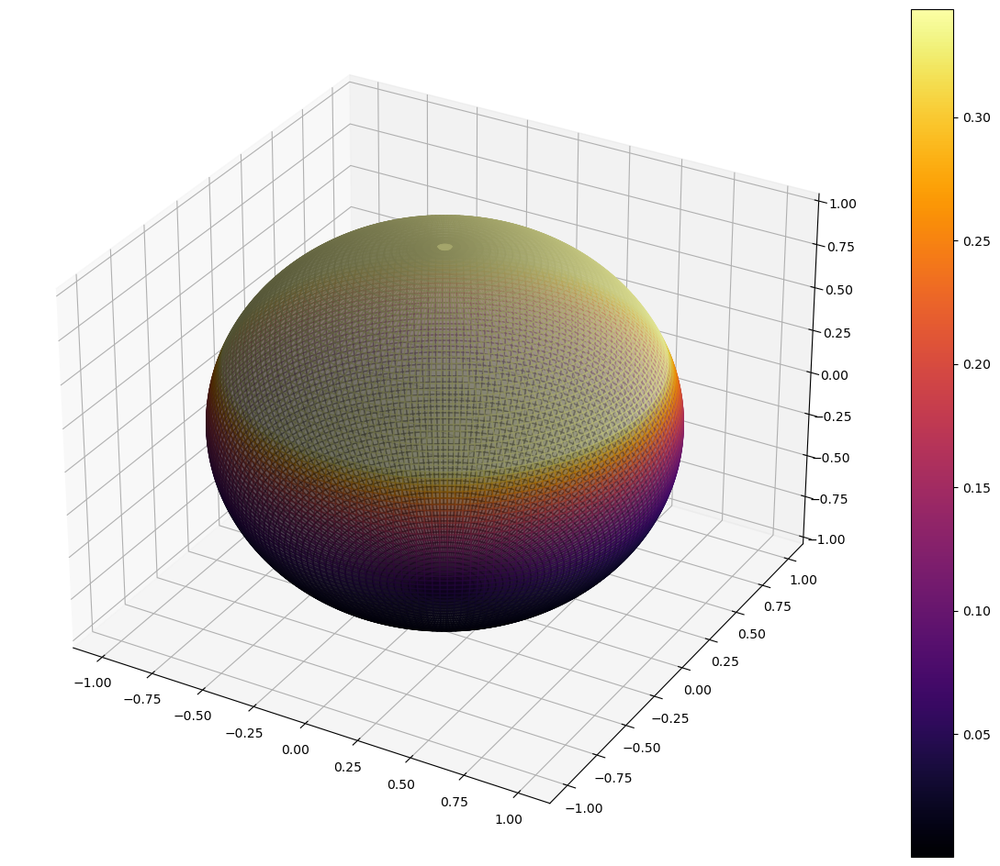

In [201]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

heat_map = vmap(lambda x2: vmap(lambda x1: p_sm(x0[-1], x1, T))(x2))(X)

# Creating the plot.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
plt.colorbar(m)

The following plot displays the heat kernel on the sphere

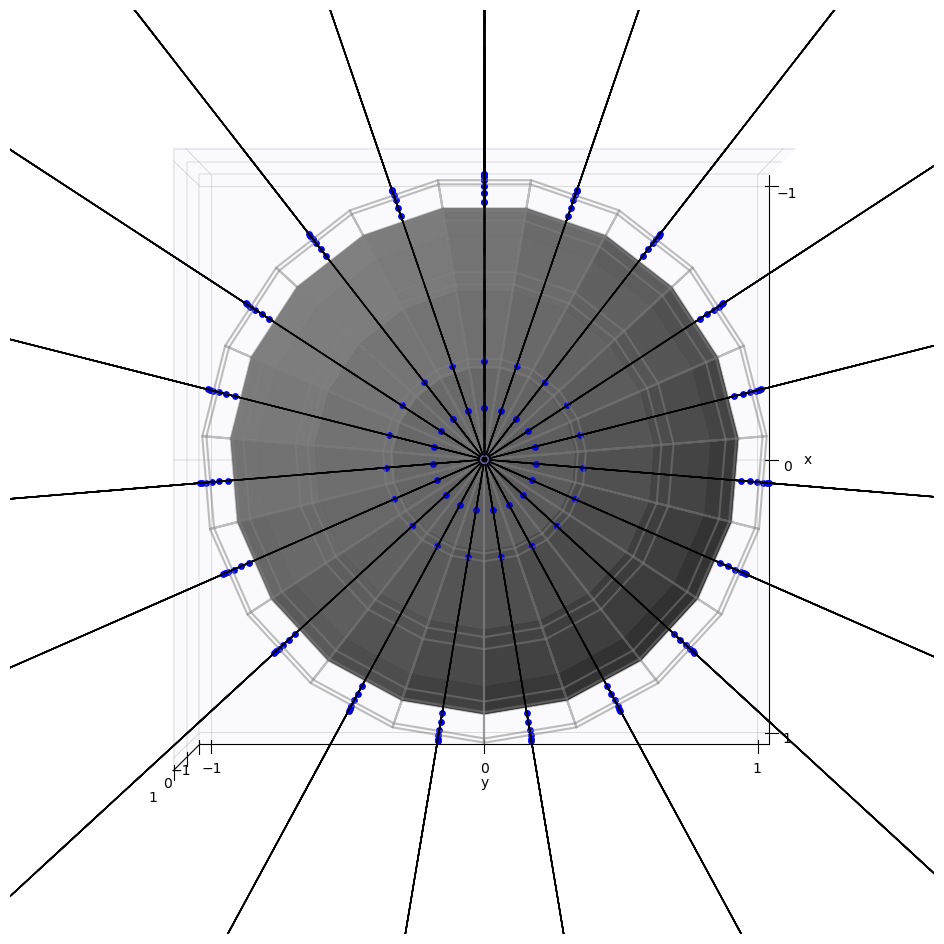

In [202]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T)),pts=20)

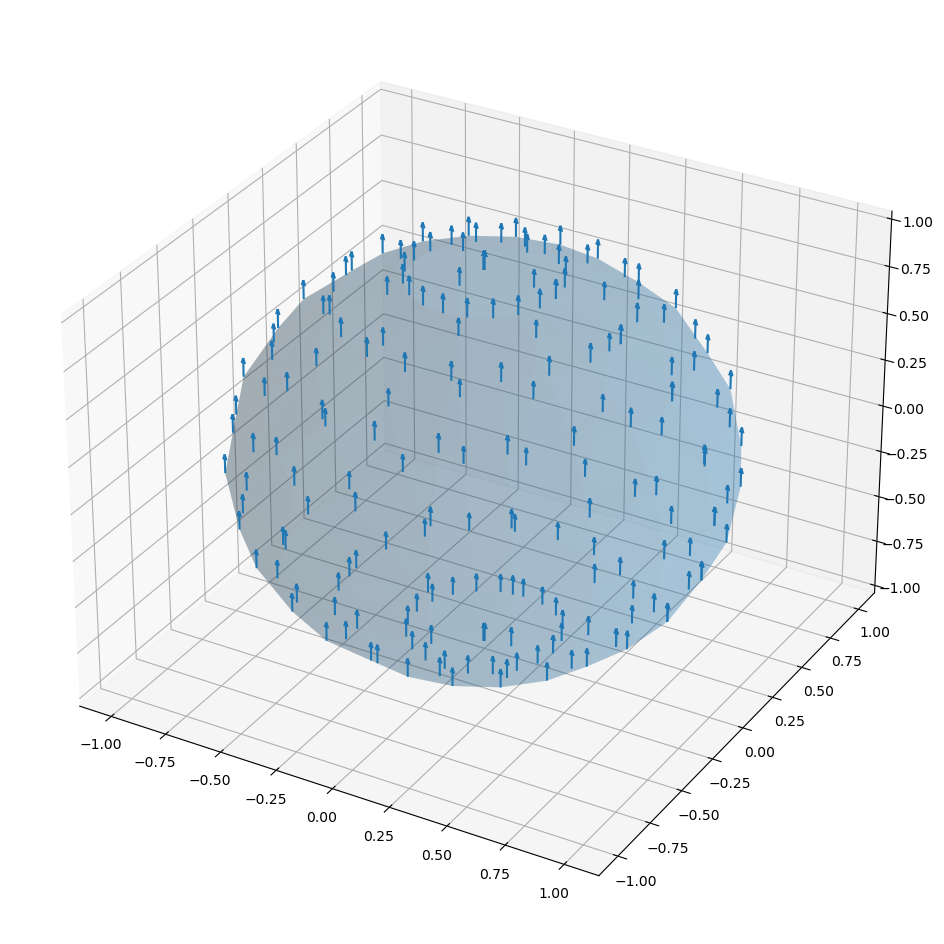

In [203]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: grad_log_p_sm(x0[-1], x2, T))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,grad_log_p_sm(x0[-1], x2, T)))(x1))(X)
#grad_log = vmap(lambda x1: vmap(lambda x2: vmap(lambda x3: net.apply(params, x3))(x2))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

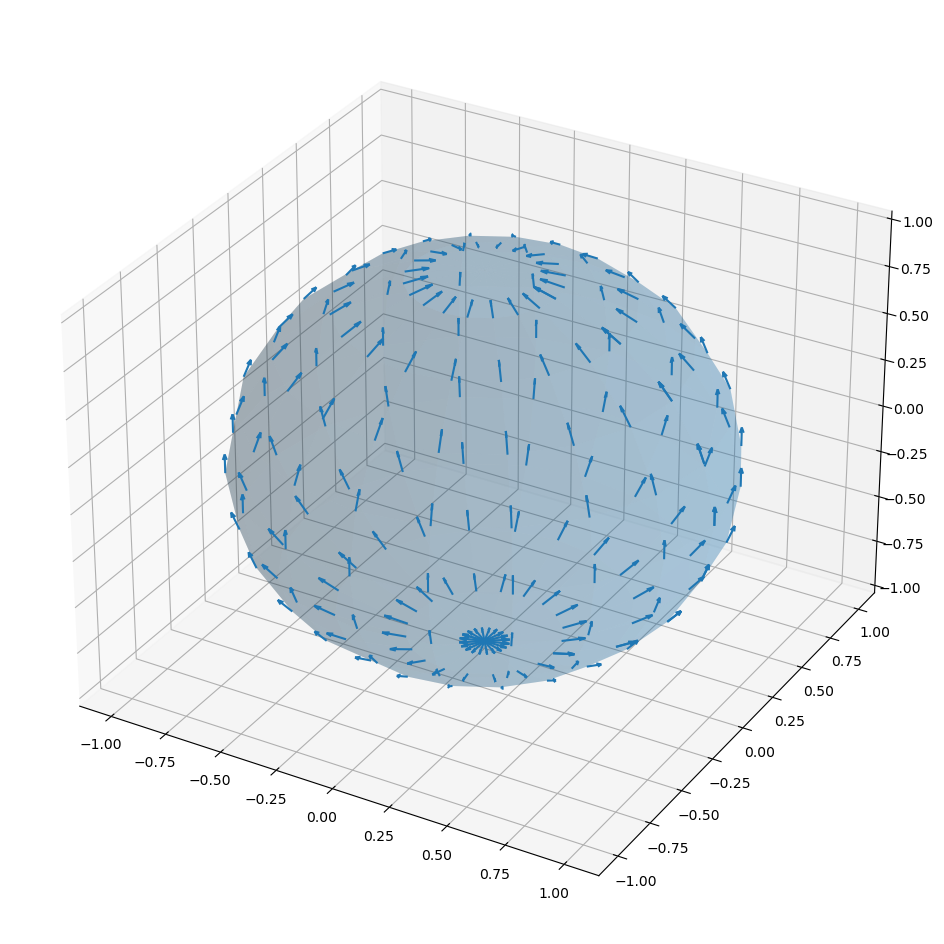

In [204]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

## Diffusion Mean

In [205]:
#%% Modules

import jax.numpy as jnp
from jax import vmap, jit, lax

#%% Code

def diffusion_mean(M, X_obs, gradlog_hk_fun, T = 1.0, eta = 0.1,
                   mu_init=None, _iter = 100):
    
    def get_coords(Fx):
        
        chart = M.centered_chart(Fx)
        
        return (M.invF((Fx,chart)),chart)
    
    def to_TM(Fx,v):
        x = get_coords(Fx)
        
        return jnp.dot(M.invJF((Fx,x[1])),v)
    
    def gradient_descent_step(mu, dummy):
        
        mu = M.Exp(mu, -eta*grad_error(mu))
        
        return mu, None
    
    if mu_init is None:
        mu_init = get_coords(X_obs[0])
        
    grad_error = jit(lambda mu: to_TM(mu[1], -jnp.sum(vmap(lambda y: gradlog_hk_fun(mu[1], y, T))(X_obs), axis=0)))
    
    yT, _ = lax.scan(gradient_descent_step, mu_init, xs=jnp.arange(0, _iter, 1))
   
    return yT

In [206]:
test = diffusion_mean(M, X_circle, grad_log_p_sm, T=T, eta = 100.0, mu_init = None, _iter=1000)

print(test)
print(x0)


(Array([0.       , 0.0516969], dtype=float32), Array([0.70710677, 0.        , 0.70710677], dtype=float32))
(Array([0., 0.], dtype=float32), Array([0., 0., 1.], dtype=float32))


## Learning $\nabla_{x}\log p$ using theoretical gradient

Some text here

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$ and $T$

In [207]:
#Hyper parameters
learning_rate = 0.001
epochs = 100
batch_size = 2**5
samples_size = batch_size*2**4
maxiter = epochs * samples_size // batch_size

In [208]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""
        
        phi = 2*jnp.pi*np.random.uniform(low=0.0, high=1.0, size=batch_size)
        theta = jnp.arccos(1-2*np.random.uniform(low=0.0, high=1.0, size=batch_size))
        
        x1 = jnp.sin(theta)*jnp.cos(phi)
        x2 = jnp.sin(theta)*jnp.sin(phi)
        x3 = jnp.cos(theta)

        yield jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), x3.reshape(1,-1))).T


In [209]:
#Brownian generator
_dts = dts(T=T)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        (ts,xss,chartss,*_) = product(tile(x0,N),
                                      _dts,
                                      dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]

        yield vmap(lambda x,chart: M.F((x,chart)))(samples,charts)

In [210]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(10), jax.nn.tanh,
        hk.Linear(5), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jax.vmap(to_TM)(x.reshape([-1,M.emb_dim]),model(x.reshape([-1,M.emb_dim]))).reshape(x.shape)
    y = model(x)
    return y

In [211]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    true_s = vmap(lambda x1: to_TM(x1,grad_log_p_sm(x0[-1], x1, T)))(data)

    return jnp.linalg.norm(s-true_s)**2

In [212]:
#Data loader
#generator = generator_unif #Generate uniformly distirbuted numbers
generator = generator_bm #Generate from Browninan motion in x0
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate) #Adam Optimizer
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 80.338.
[Step 20], epoch 1, training loss: 58.381.
[Step 30], epoch 1, training loss: 72.898.
[Step 40], epoch 2, training loss: 39.185.
[Step 50], epoch 3, training loss: 73.092.
[Step 60], epoch 3, training loss: 70.909.
[Step 70], epoch 4, training loss: 62.582.
[Step 80], epoch 5, training loss: 67.090.
[Step 90], epoch 5, training loss: 41.108.
[Step 100], epoch 6, training loss: 36.446.
[Step 110], epoch 6, training loss: 52.104.
[Step 120], epoch 7, training loss: 31.155.
[Step 130], epoch 8, training loss: 30.855.
[Step 140], epoch 8, training loss: 44.375.
[Step 150], epoch 9, training loss: 20.607.
[Step 160], epoch 10, training loss: 33.671.
[Step 170], epoch 10, training loss: 25.642.
[Step 180], epoch 11, training loss: 22.102.
[Step 190], epoch 11, training loss: 13.983.
[Step 200], epoch 12, training loss: 9.531.
[Step 210], epoch 13, training loss: 11.263.
[Step 220], epoch 13, training loss: 9.27

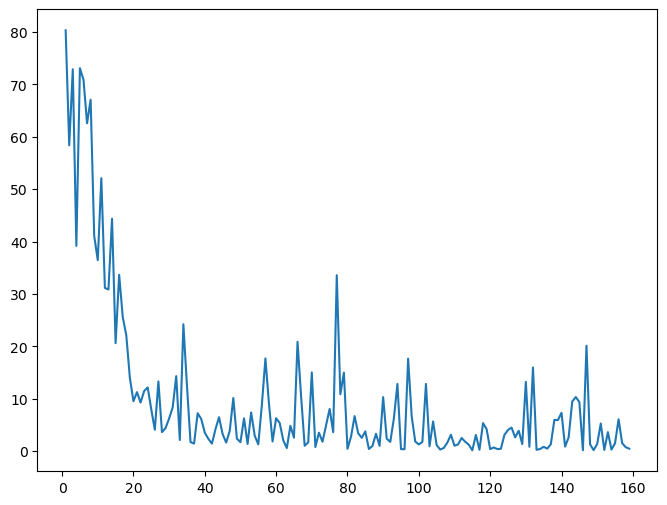

In [213]:
plt.figure(figsize=(8,6))
plt.plot(loss)

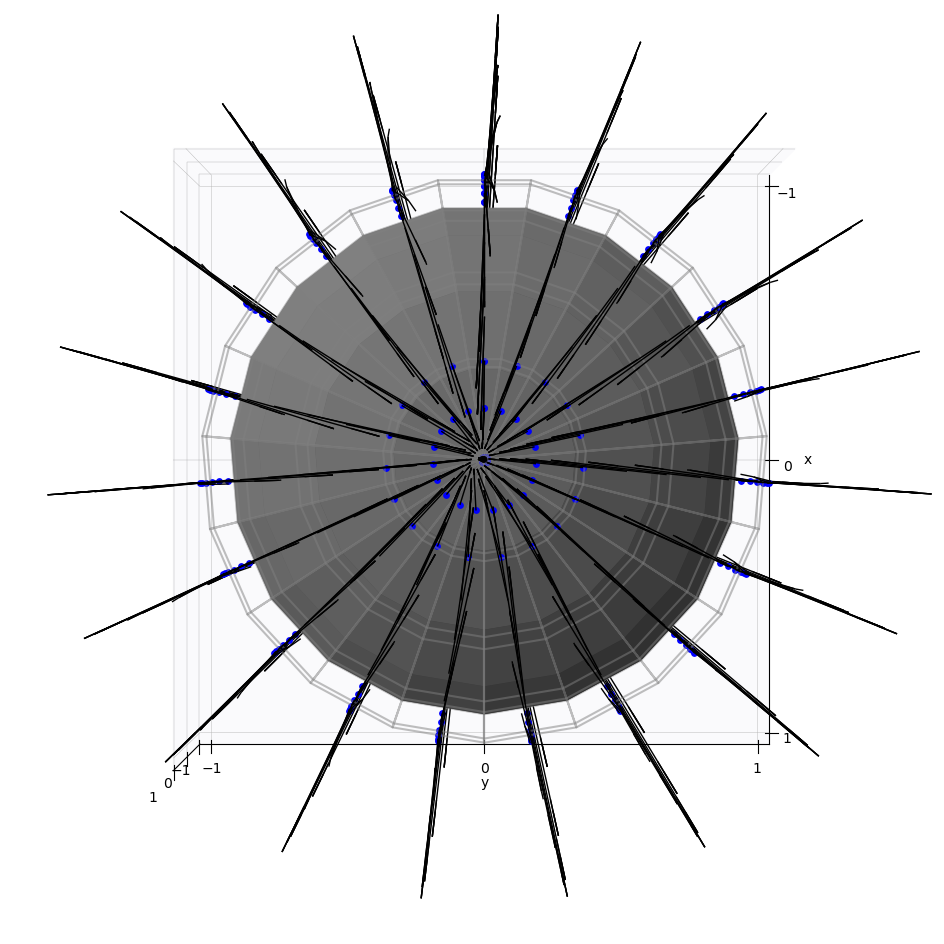

In [214]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,Fx)),pts=20)

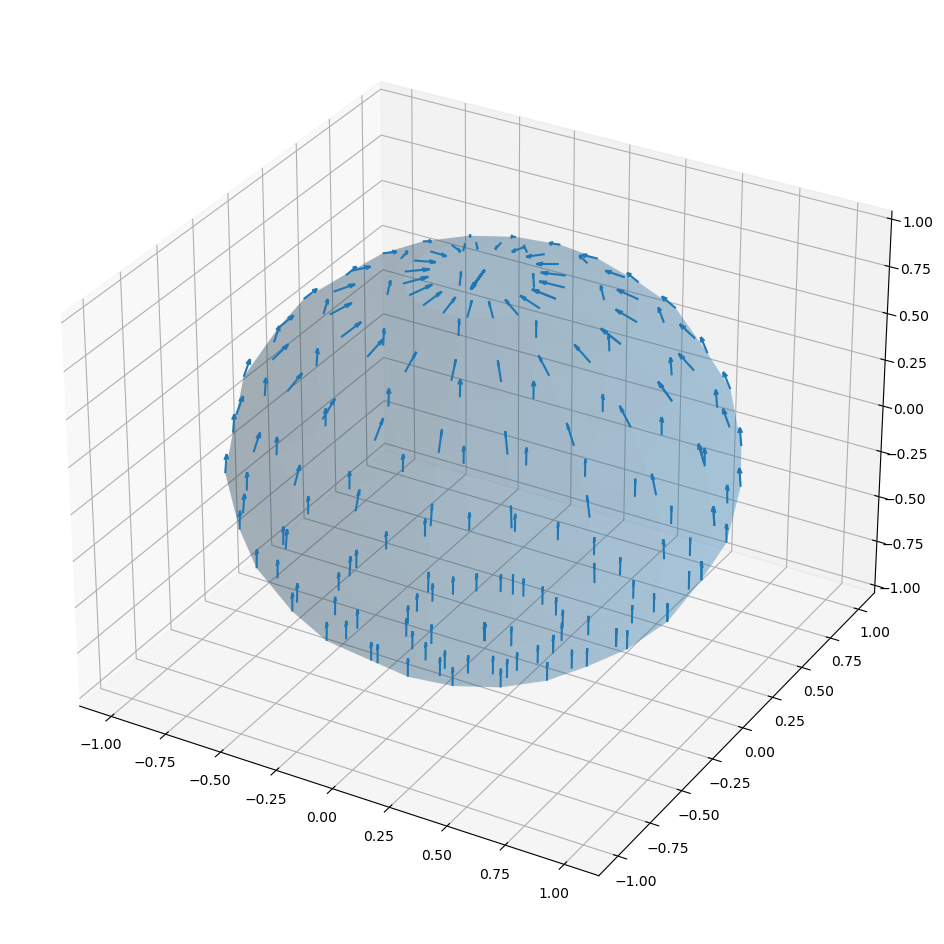

In [215]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,x2))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,x2)))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

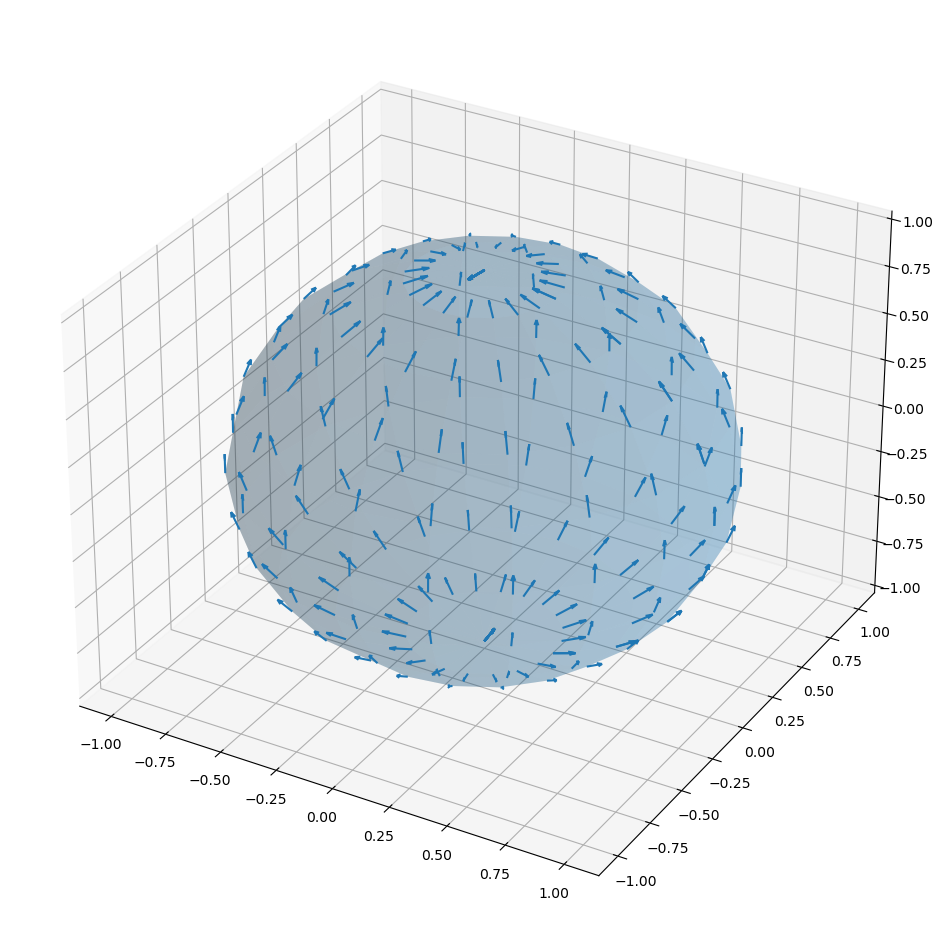

In [216]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

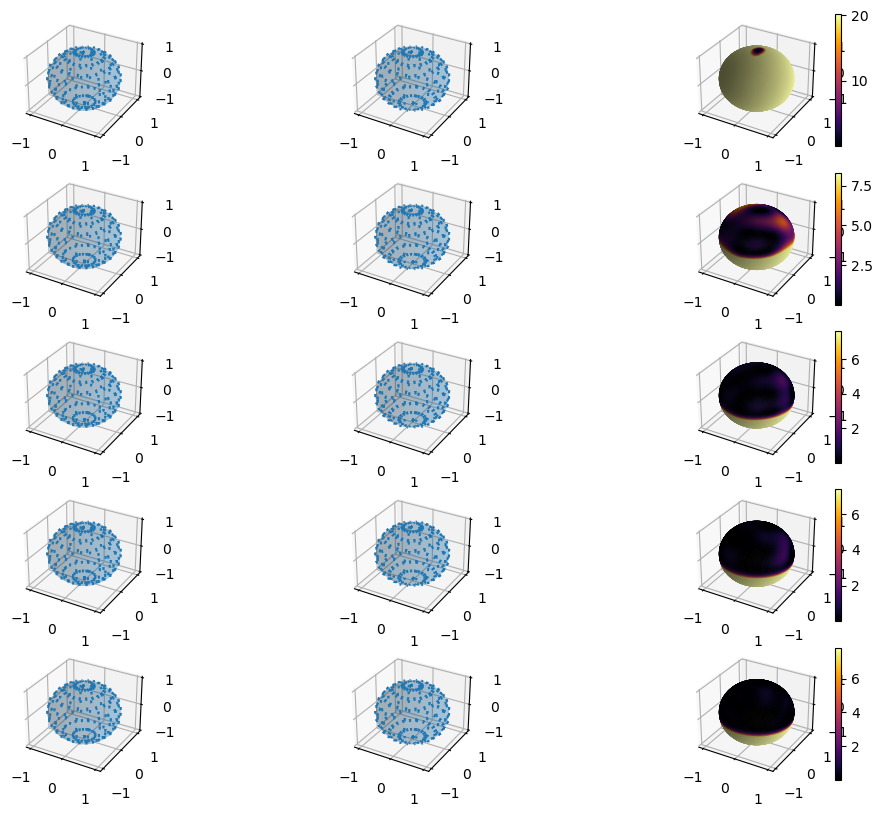

In [217]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,x2))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,x2)))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],Fx))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,Fx))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $T$

In [239]:
#Hyper parameters
learning_rate = 0.01 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
repeats = 2**3
batch_size = samples_per_x0*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [240]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""
        
        phi = 2*jnp.pi*np.random.uniform(low=0.0, high=1.0, size=repeats)
        theta = jnp.arccos(1-2*np.random.uniform(low=0.0, high=1.0, size=repeats))
        
        x1 = jnp.sin(theta)*jnp.cos(phi)
        x2 = jnp.sin(theta)*jnp.sin(phi)
        x3 = jnp.cos(theta)
        
        x0 = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), x3.reshape(1,-1))).T
        x0 = jnp.repeat(x0, samples_per_x0, axis=0)
        
        phi = 2*jnp.pi*np.random.uniform(low=0.0, high=1.0, size=batch_size)
        theta = jnp.arccos(1-2*np.random.uniform(low=0.0, high=1.0, size=batch_size))
        
        x1 = jnp.sin(theta)*jnp.cos(phi)
        x2 = jnp.sin(theta)*jnp.sin(phi)
        x3 = jnp.cos(theta)
        
        xT = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), x3.reshape(1,-1))).T
        
        yield jnp.hstack((x0, xT))

In [241]:
global x0s
x0s = tile(x0,batch_size)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        _dts = dts(T=T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (jnp.repeat(samples[::samples_per_x0],samples_per_x0,axis=0),
               jnp.repeat(charts[::samples_per_x0],samples_per_x0,axis=0))
        yield jnp.hstack((Fx0s,
                          jax.vmap(lambda x,chart: M.F((x,chart)))(samples,charts)))

In [242]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(40), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(10), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jnp.squeeze(jax.vmap(to_TM)(x.reshape([-1,2*M.emb_dim])[:,M.emb_dim:],model(x.reshape([-1,2*M.emb_dim]))))
    y = model(x)
    return y

In [243]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:2*M.emb_dim]
    #true_s = vmap(lambda x0, x1, t: to_TM(x0,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    true_s = vmap(lambda x0, x1: to_TM(x1,grad_log_p_sm(x0, x1, T)))(Fx0s, Fxts)
    
    return jnp.linalg.norm(s-true_s)**2

In [244]:
#generator = generator_unif
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 378.284.
[Step 20], epoch 1, training loss: 230.436.
[Step 30], epoch 1, training loss: 159.488.
[Step 40], epoch 2, training loss: 196.616.
[Step 50], epoch 3, training loss: 189.859.
[Step 60], epoch 3, training loss: 160.525.
[Step 70], epoch 4, training loss: 143.408.
[Step 80], epoch 5, training loss: 146.846.
[Step 90], epoch 5, training loss: 122.983.
[Step 100], epoch 6, training loss: 96.852.
[Step 110], epoch 6, training loss: 79.481.
[Step 120], epoch 7, training loss: 68.818.
[Step 130], epoch 8, training loss: 53.222.
[Step 140], epoch 8, training loss: 47.890.
[Step 150], epoch 9, training loss: 35.567.
[Step 160], epoch 10, training loss: 50.313.
[Step 170], epoch 10, training loss: 32.748.
[Step 180], epoch 11, training loss: 29.320.
[Step 190], epoch 11, training loss: 31.038.
[Step 200], epoch 12, training loss: 25.678.
[Step 210], epoch 13, training loss: 23.977.
[Step 220], epoch 13, training 

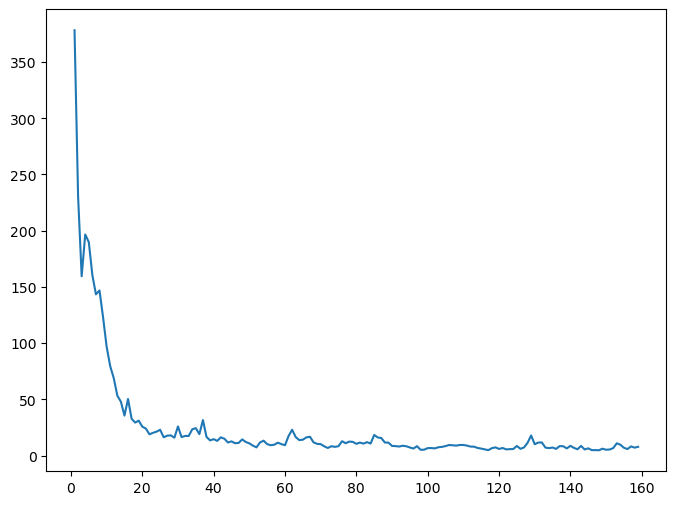

In [245]:
plt.figure(figsize=(8,6))
plt.plot(loss)

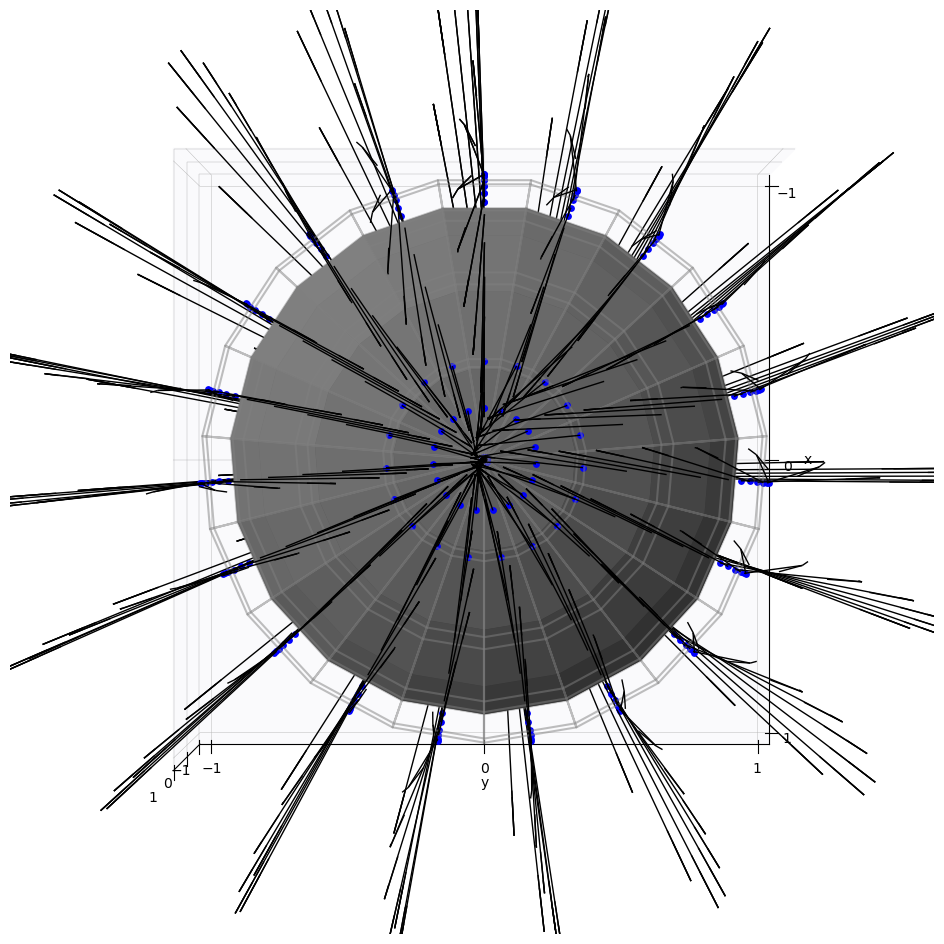

In [246]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx)))),pts=20)

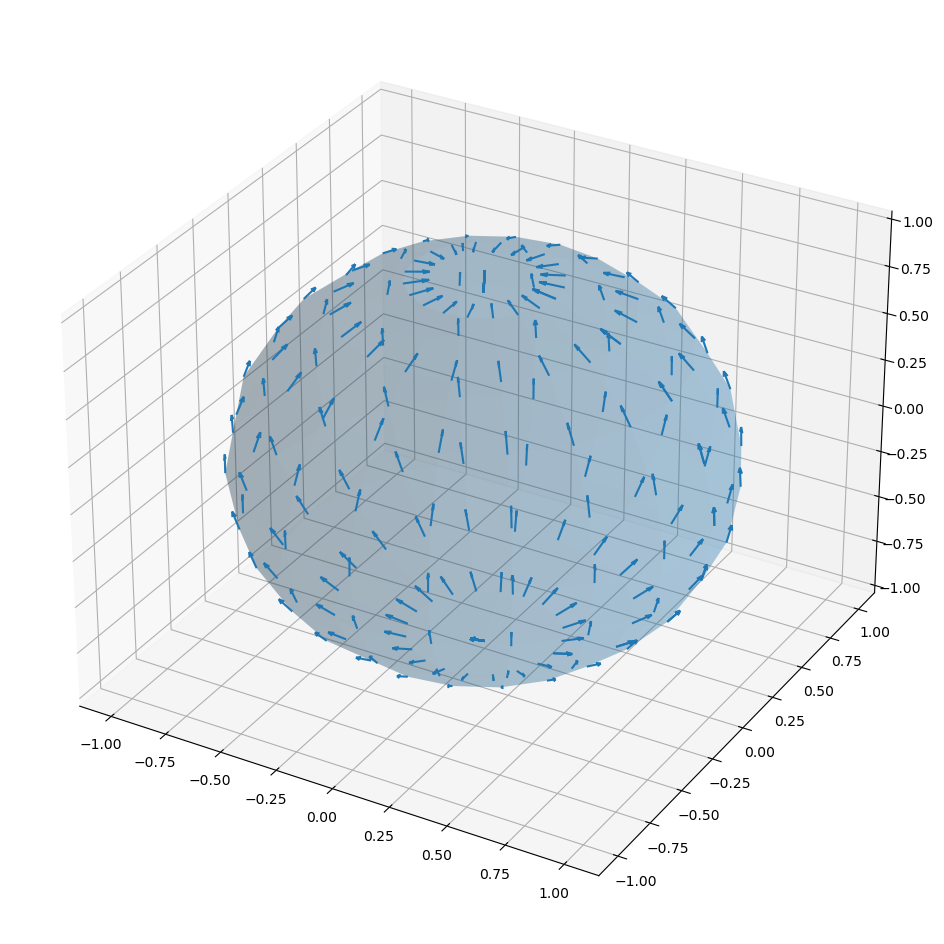

In [247]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2))))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2)))))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

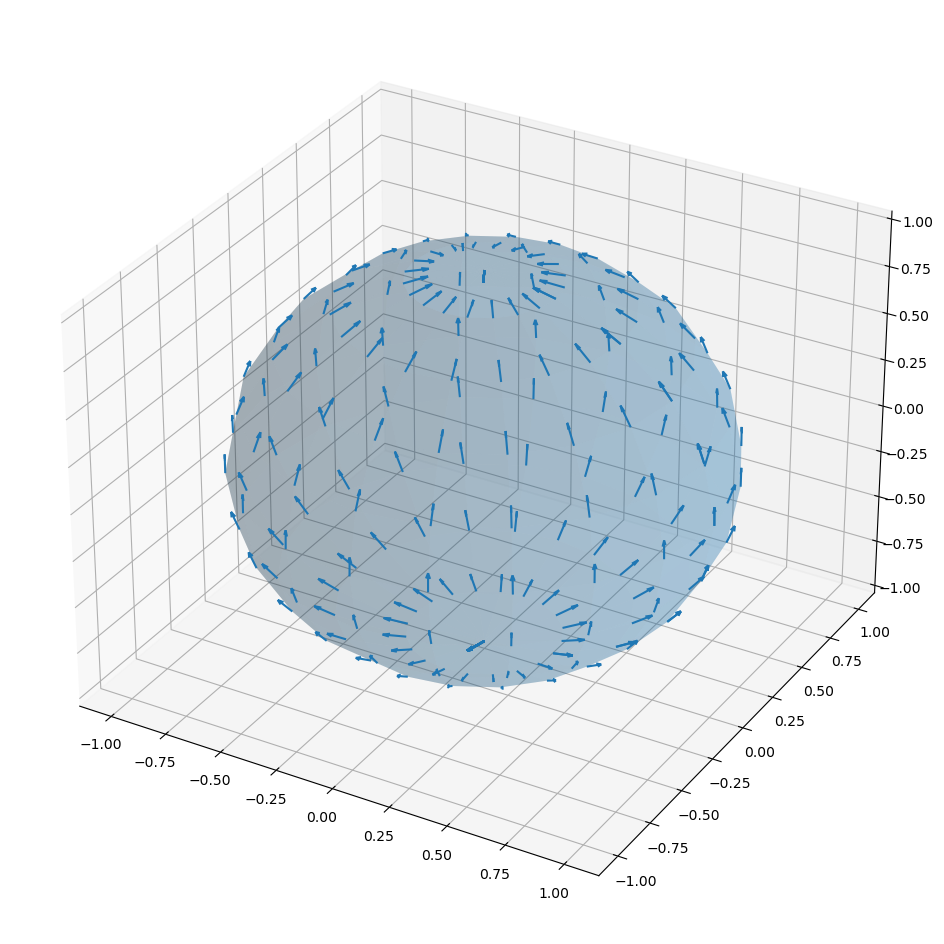

In [248]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

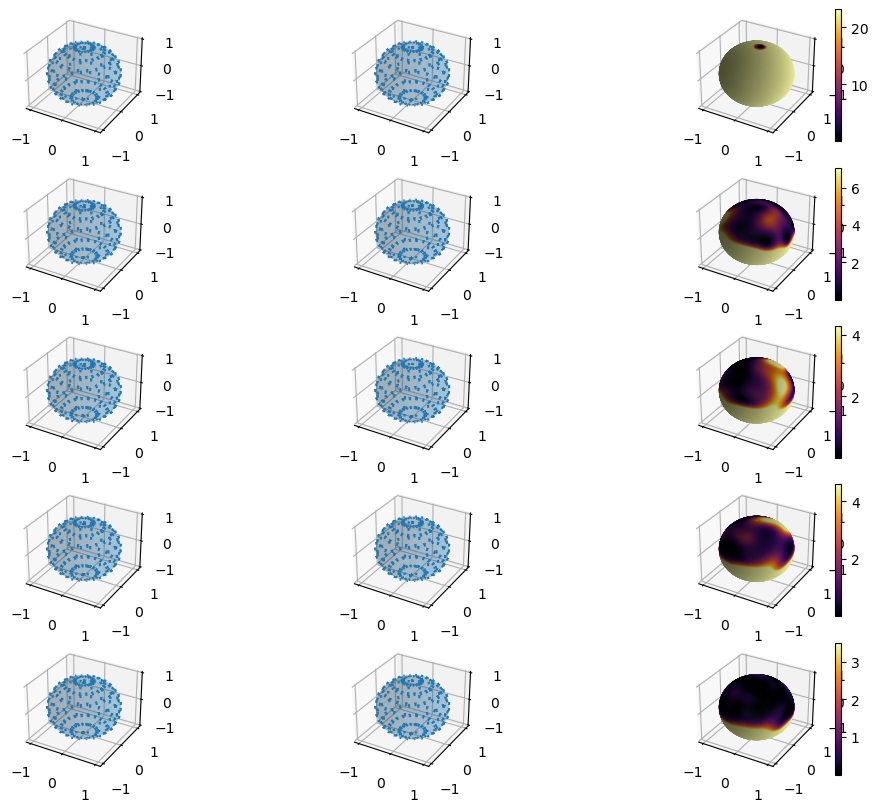

In [249]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2))))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2)))))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],jnp.hstack((M.F(x0),Fx))))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx))))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$

In [250]:
#Hyper parameters
learning_rate = 0.01 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
ts_per_batch = 2**4
repeats = 2**5
batch_size = ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [256]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""
        
        phi = 2*jnp.pi*np.random.uniform(low=0.0, high=1.0, size=batch_size)
        theta = jnp.arccos(1-2*np.random.uniform(low=0.0, high=1.0, size=batch_size))
        
        x1 = jnp.sin(theta)*jnp.cos(phi)
        x2 = jnp.sin(theta)*jnp.sin(phi)
        x3 = jnp.cos(theta)
        
        xT = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), x3.reshape(1,-1))).T
        
        t = jnp.repeat(np.random.uniform(low = 0.0, high = max_T, size = ts_per_batch), 
                       repeats, axis=0)
        
        yield jnp.hstack((xT, t.reshape(-1,1)))

In [257]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = repeats
        _dts = dts(T=max_T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))        
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([49,99])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts.reshape((-1,1)),N,axis=1).reshape((-1,1))
                        ))

In [258]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(30), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    y = model(x)
    return y

In [259]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    Fxts = data[:,0:M.emb_dim]
    ts = data[:,-1]
    #true_s = vmap(lambda x0, x1, t: to_TM(x0,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    true_s = vmap(lambda x1, t: to_TM(x1,grad_log_p_sm(x0[-1], x1, t)))(Fxts, ts)
    
    return jnp.linalg.norm(s-true_s)**2

In [260]:
#generator = generator_unif
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 1925.200.
[Step 20], epoch 1, training loss: 1608.194.
[Step 30], epoch 1, training loss: 3028.256.
[Step 40], epoch 2, training loss: 19896.863.
[Step 50], epoch 3, training loss: 539.696.
[Step 60], epoch 3, training loss: 484.405.
[Step 70], epoch 4, training loss: 1130.763.
[Step 80], epoch 5, training loss: 1480.466.
[Step 90], epoch 5, training loss: 4046.407.
[Step 100], epoch 6, training loss: 2500.906.
[Step 110], epoch 6, training loss: 210.227.
[Step 120], epoch 7, training loss: 816.182.
[Step 130], epoch 8, training loss: 565.195.
[Step 140], epoch 8, training loss: 1683.418.
[Step 150], epoch 9, training loss: 937.781.
[Step 160], epoch 10, training loss: 241.525.
[Step 170], epoch 10, training loss: 225713.141.
[Step 180], epoch 11, training loss: 252.140.
[Step 190], epoch 11, training loss: 20655.461.
[Step 200], epoch 12, training loss: 772.548.
[Step 210], epoch 13, training loss: 726.870.
[Ste

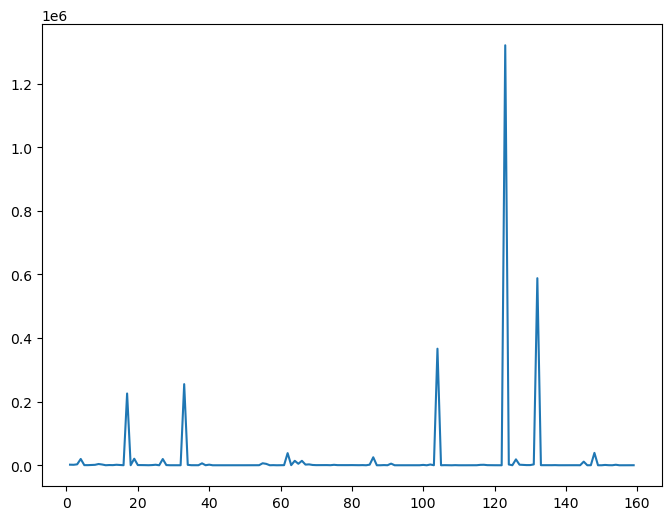

In [261]:
plt.figure(figsize=(8,6))
plt.plot(loss)

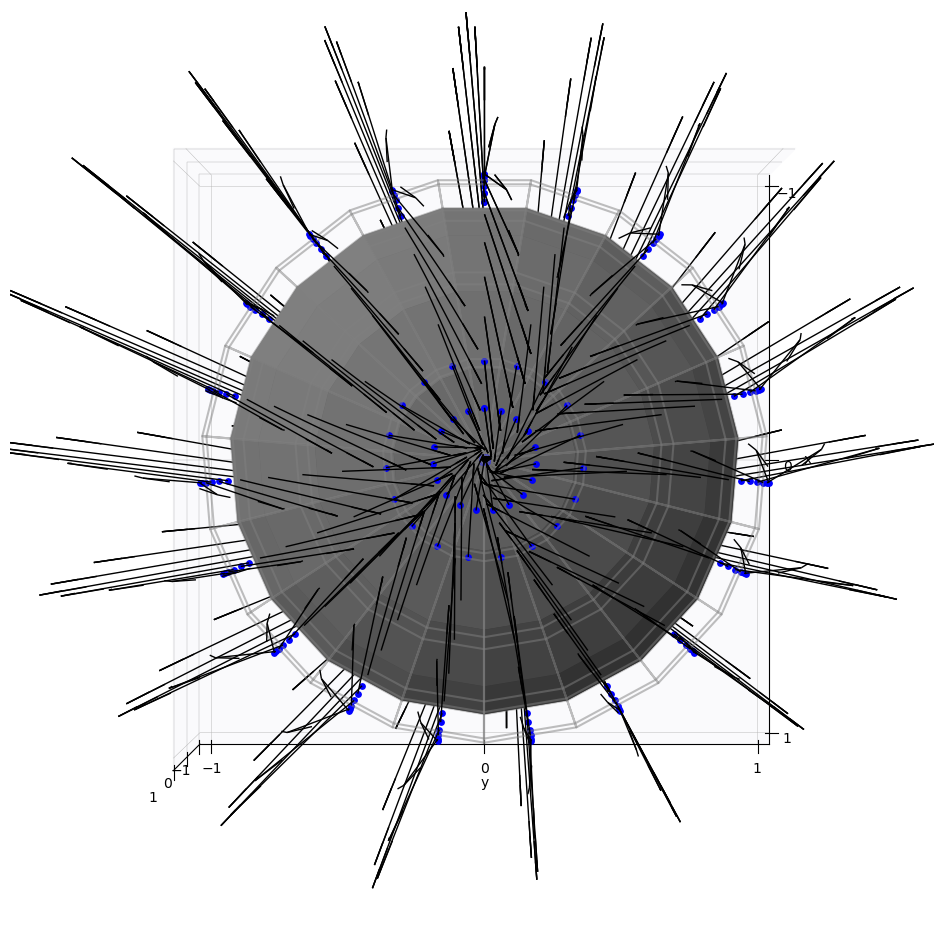

In [263]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((Fx, T)))),pts=20)

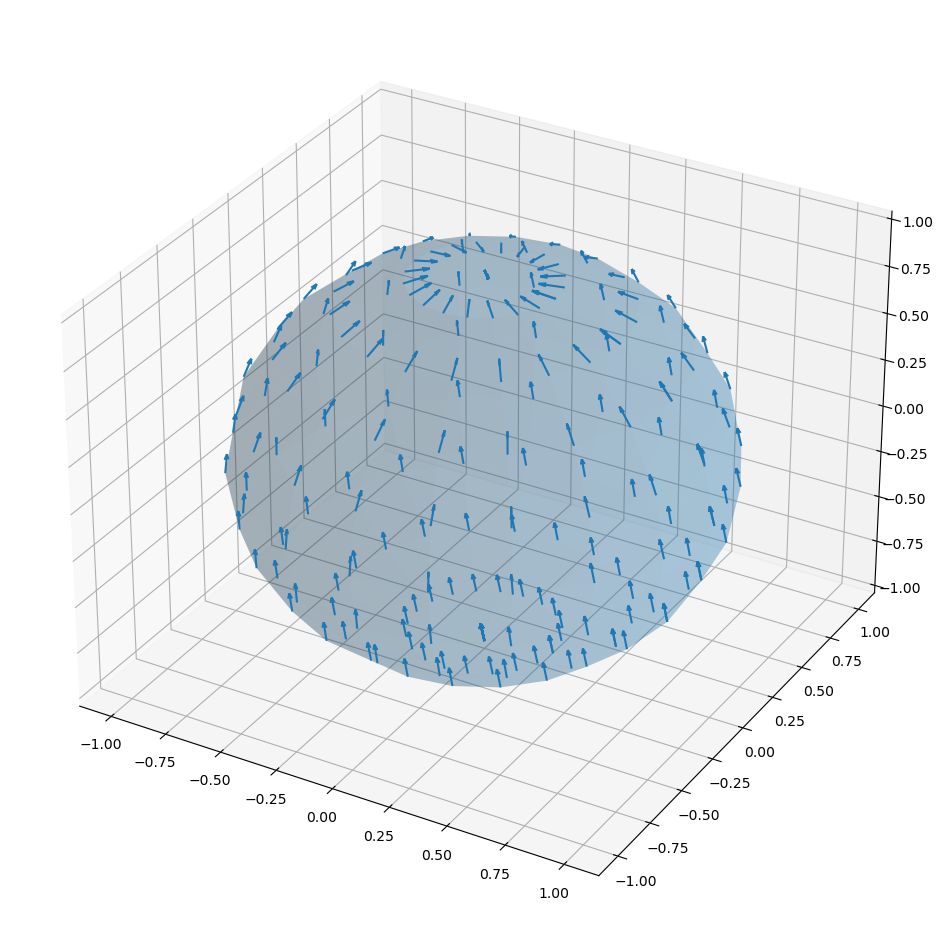

In [265]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((x2, T))))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((x2, T)))))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

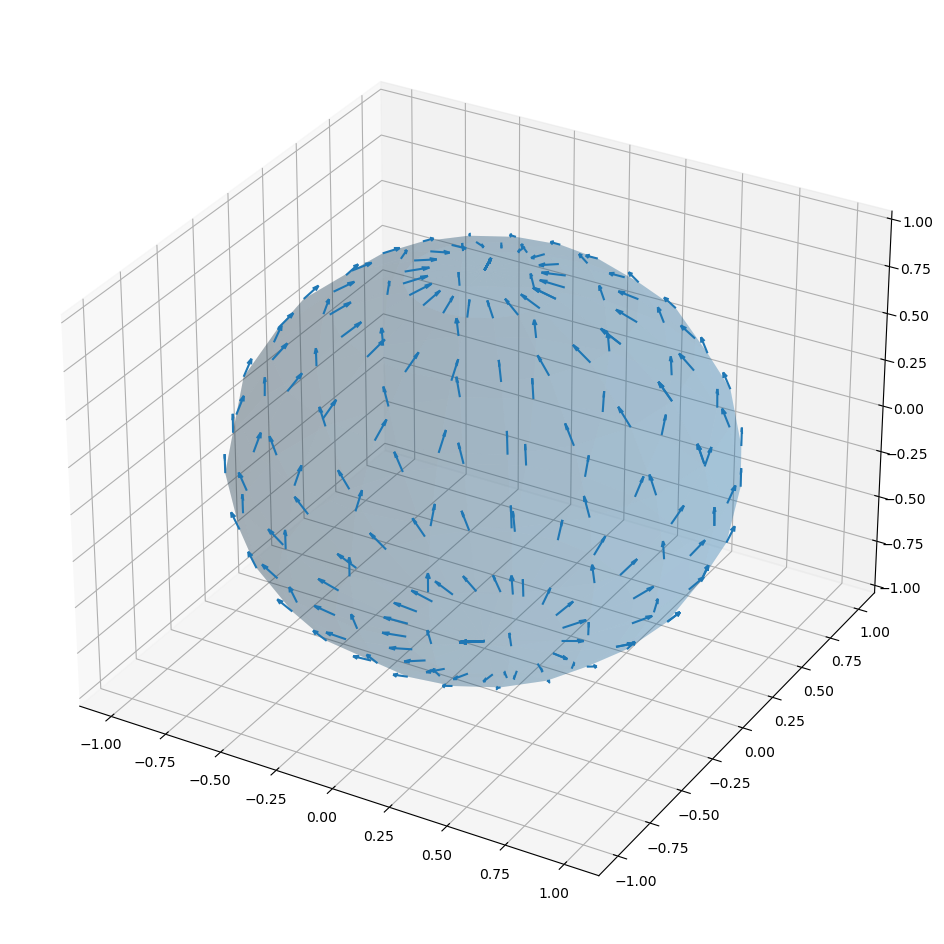

In [266]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

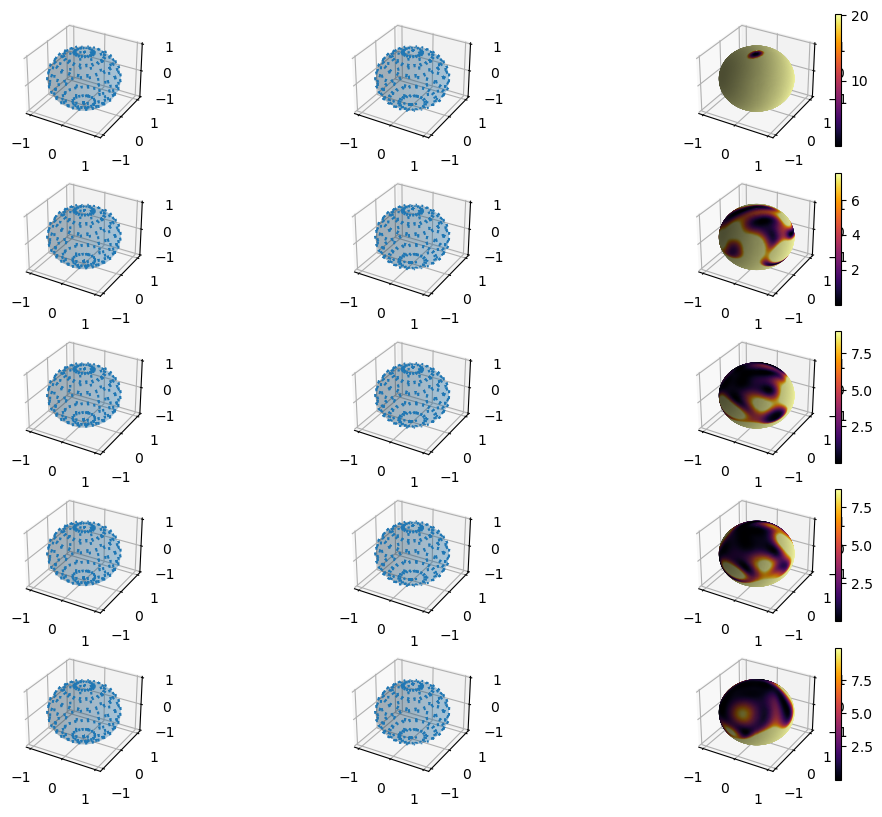

In [267]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((x2, T))))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((x2, T)))))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],jnp.hstack((Fx, T))))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((Fx, T))))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ in general

In [274]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
ts_per_batch = 2**7
repeats = 2**3
batch_size = samples_per_x0*ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [275]:
#Uniform generator
def generator_unif():
    while True:
        """Generates batches of samples."""
        
        phi = 2*jnp.pi*np.random.uniform(low=0.0, high=1.0, size=repeats)
        theta = jnp.arccos(1-2*np.random.uniform(low=0.0, high=1.0, size=repeats))
        
        x1 = jnp.sin(theta)*jnp.cos(phi)
        x2 = jnp.sin(theta)*jnp.sin(phi)
        x3 = jnp.cos(theta)
        
        x0 = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), x3.reshape(1,-1))).T
        x0 = jnp.repeat(x0, samples_per_x0*ts_per_batch, axis=0)
        
        phi = 2*jnp.pi*np.random.uniform(low=0.0, high=1.0, size=samples_per_x0*repeats*ts_per_batch)
        theta = jnp.arccos(1-2*np.random.uniform(low=0.0, high=1.0, size=samples_per_x0*repeats*ts_per_batch))
        
        x1 = jnp.sin(theta)*jnp.cos(phi)
        x2 = jnp.sin(theta)*jnp.sin(phi)
        x3 = jnp.cos(theta)
        
        xT = jnp.concatenate((x1.reshape(1,-1), x2.reshape(1,-1), x3.reshape(1,-1))).T
        
        t = jnp.repeat(np.random.uniform(low = 0.0, high = max_T, size = ts_per_batch), 
                       repeats*samples_per_x0, axis=0)
        
        yield jnp.hstack((x0, xT, t.reshape(-1,1)))

In [276]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = samples_per_x0*repeats
        _dts = dts(T=max_T, n_steps=1000)
        global x0s
        (ts,xss,chartss,*_) = product((jnp.repeat(x0s[0],samples_per_x0,axis=0),jnp.repeat(x0s[1],samples_per_x0,axis=0)),
                                      _dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (xss[-1,::samples_per_x0],chartss[-1,::samples_per_x0])
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([-1,-1])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jnp.tile(jnp.repeat(Fx0s,samples_per_x0,axis=0),(ts_per_batch,1)),
                         jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts,N).reshape((-1,1))
                        ))

In [277]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(400), jax.nn.tanh,
        hk.Linear(200), jax.nn.tanh,
        hk.Linear(100), jax.nn.tanh,
        hk.Linear(50), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    
    y = model(x)
    
    return y

In [278]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:2*M.emb_dim]
    ts = data[:,-1]
    #true_s = vmap(lambda x0, x1, t: to_TM(x0,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    true_s = vmap(lambda x0, x1, t: to_TM(x1,grad_log_p_sm(x0, x1, t)))(Fx0s, Fxts, ts)
    
    return jnp.linalg.norm(s-true_s)**2

In [279]:
#generator = generator_unif
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 67891096.000.
[Step 20], epoch 1, training loss: 1030209856.000.
[Step 30], epoch 1, training loss: 2802246656.000.
[Step 40], epoch 2, training loss: 426059520.000.
[Step 50], epoch 3, training loss: 17573425152.000.
[Step 60], epoch 3, training loss: 2134952.000.
[Step 70], epoch 4, training loss: 16003151.000.
[Step 80], epoch 5, training loss: 1196038.125.
[Step 90], epoch 5, training loss: 91096960.000.
[Step 100], epoch 6, training loss: 27291528.000.
[Step 110], epoch 6, training loss: 411907552.000.
[Step 120], epoch 7, training loss: 10809839.000.
[Step 130], epoch 8, training loss: 348036704.000.
[Step 140], epoch 8, training loss: 59289812.000.
[Step 150], epoch 9, training loss: 419062880.000.
[Step 160], epoch 10, training loss: 26158330.000.
[Step 170], epoch 10, training loss: 27565710.000.
[Step 180], epoch 11, training loss: 33396740.000.
[Step 190], epoch 11, training loss: 309609312.000.
[Step 

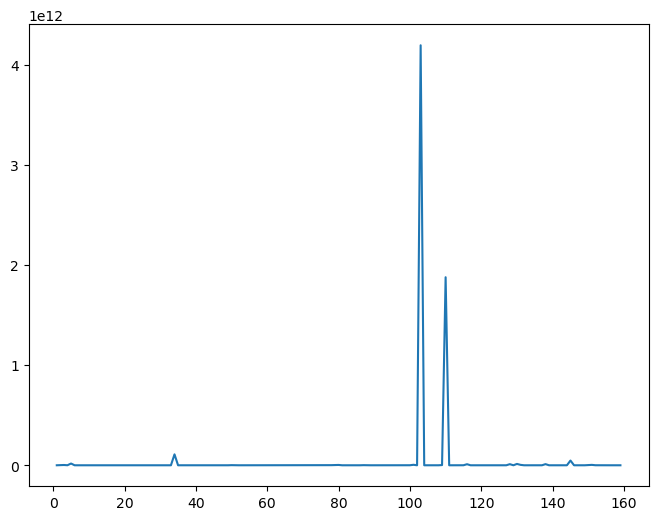

In [280]:
plt.figure(figsize=(8,6))
plt.plot(loss)

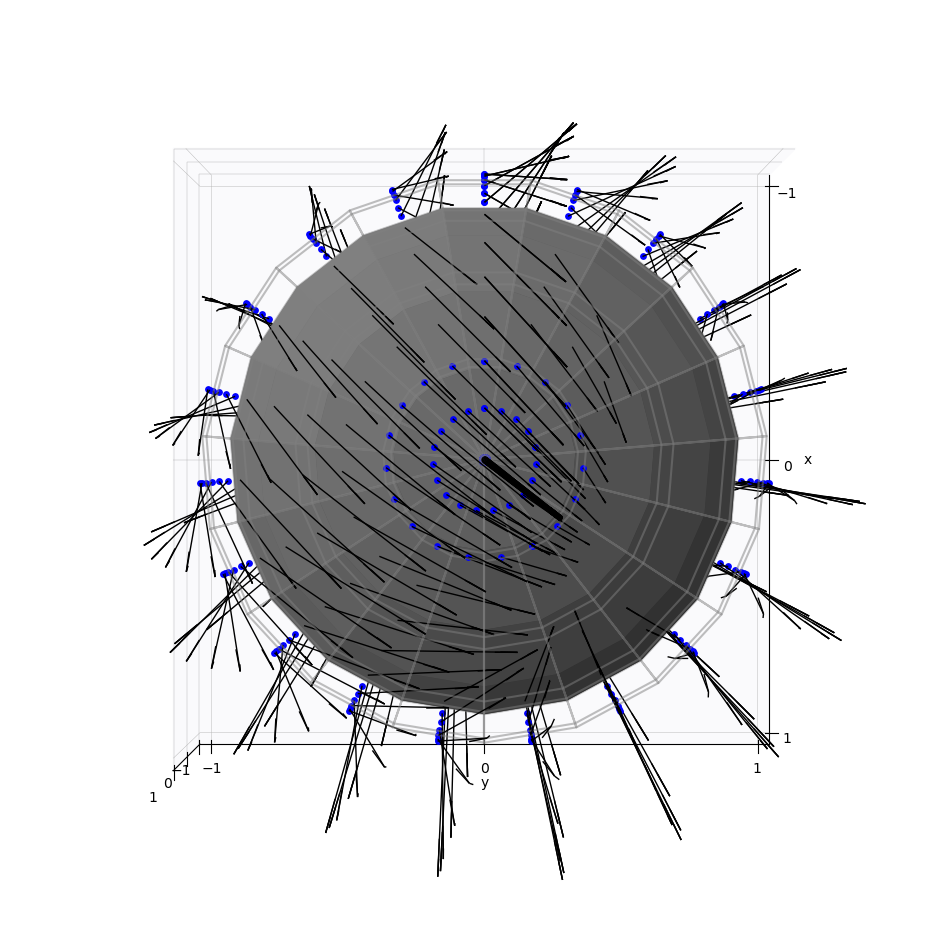

In [281]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx, T)))),pts=20)

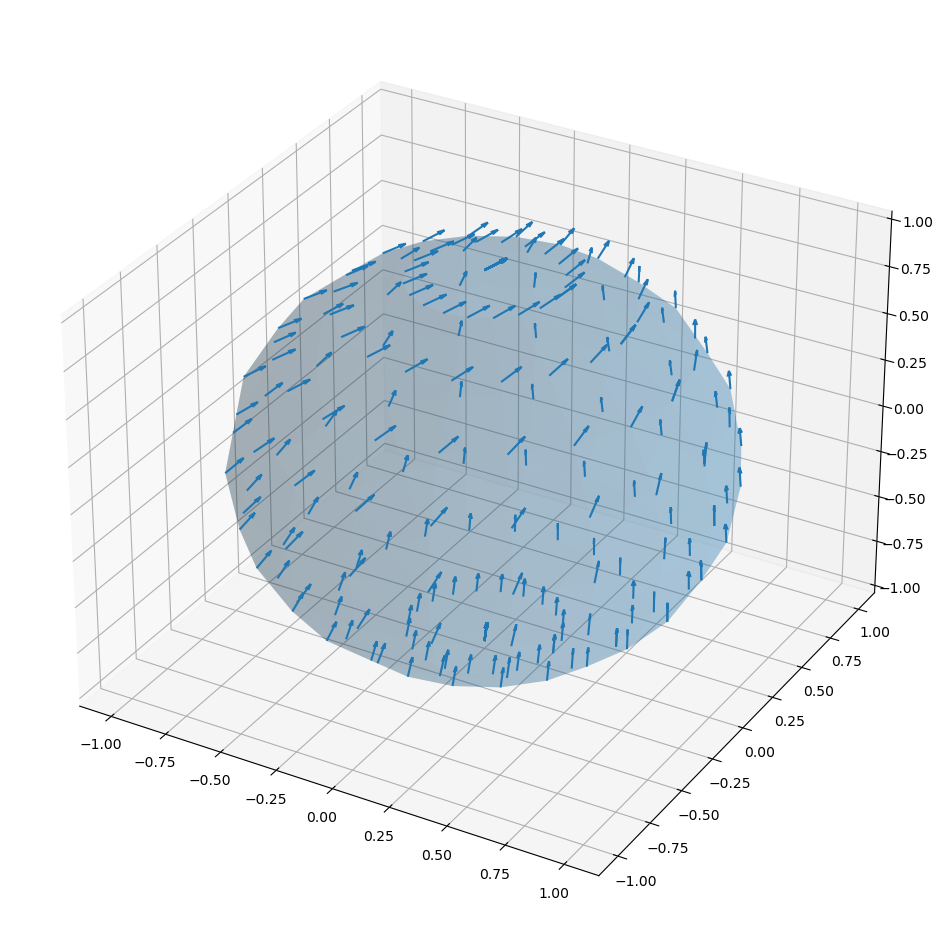

In [282]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2, T))))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2, T)))))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

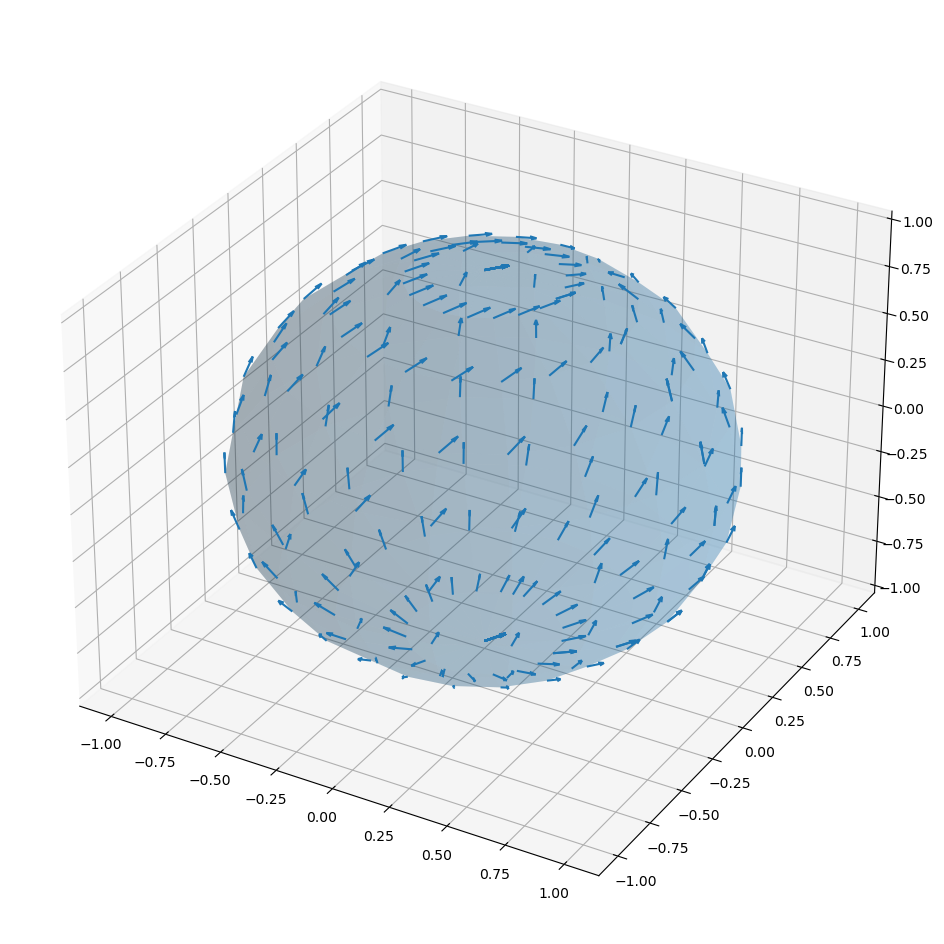

In [283]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

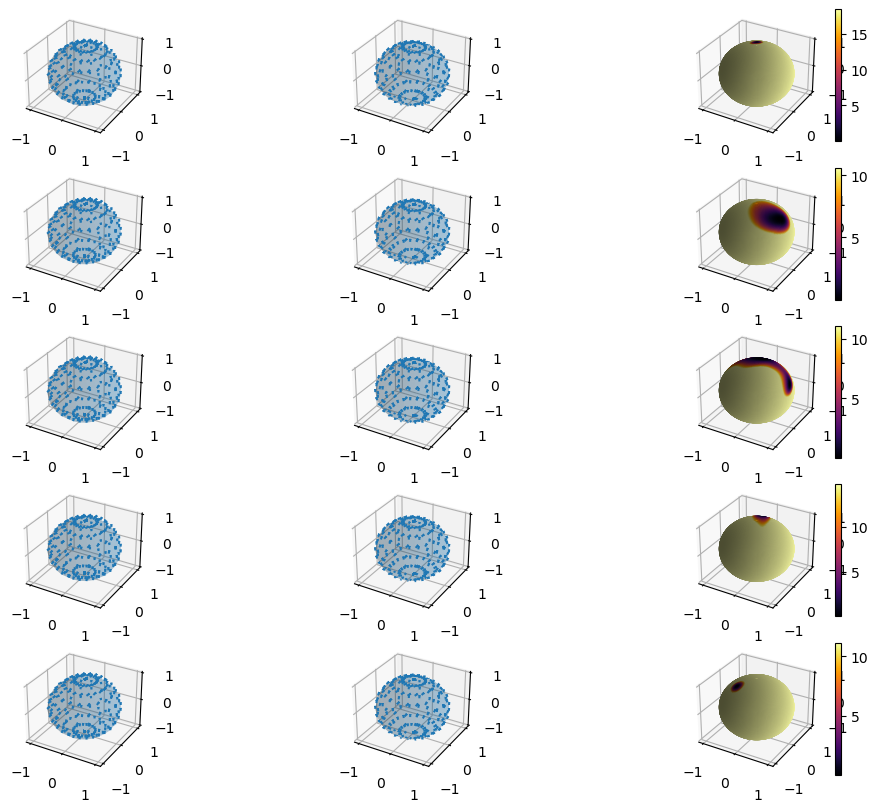

In [284]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2, T))))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2, T)))))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],jnp.hstack((M.F(x0),Fx, T))))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx, T))))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

## Learning $\nabla_{x}\log p$

Following "Riemannian Score-Based Generative Modelling" by Bortoli et. al. it follows that

\begin{equation}
    \nabla_{x} \log p(x, y, t) = \int_{\mathcal{M}} \nabla_{x}p(x,y,t) \,\mathbb{P}_{s|t}(x_{t}, \,dx_{s}),
\end{equation}

can be minimized as

\begin{equation}
    \mathcal{l}_{t|s} = \int_{\mathcal{M}^{2}} ||\nabla_{x} \log p(x,y,t) - s_{\theta}(x,t)||,
\end{equation}

where $s_{\theta}$ is a neural network with parameters $\theta$. Using integration by parts it follows that

\begin{equation}
    \mathcal{l}_{t|s} = \int_{\mathcal{M}} \left(||s(x,t)||^{2} + 2\text{div}\left(s_{t}\right)(x_{t})\right)\,d\mathbb{P}_{t}(x_{t})+\int_{\mathcal{M}^{2}}||\nabla_{x}\log p_{t|s}(x_{t}|x_{s})\,d\mathbb{P}_{s,t}(x_{s},x_{t}),
\end{equation}

where the latter term is independent of $s_{\theta}$.

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$ and $T$

In [338]:
#Hyper parameters
learning_rate = 0.001
epochs = 100
batch_size = 2**5
samples_size = batch_size*2**4
maxiter = epochs * samples_size // batch_size

In [339]:
#Brownian generator
_dts = dts(T=T)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        (ts,xss,chartss,*_) = product(tile(x0,N),
                                      _dts,
                                      dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]

        yield vmap(lambda x,chart: M.F((x,chart)))(samples,charts)

In [340]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(40), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jax.vmap(to_TM)(x.reshape([-1,M.emb_dim]),model(x.reshape([-1,M.emb_dim]))).reshape(x.shape)
    y = model(x)
    return y

In [341]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params, data)
    (xs,charts) = jax.vmap(get_coords)(data)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda x,chart,s: M.div((x,chart),
                                            lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                net.apply(params,M.F(x))))
                   )(xs,charts,s)
#     # plot
#     newfig()
#     M.plot()
#     for i in range(xs.shape[0]):
#         M.plotx((xs[i],charts[i]))
#     plt.show()
    return jnp.mean(norm2s+2.0*divs)

In [342]:
#Data loader
generator = generator_bm #Generate from Browninan motion in x0
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate) #Adam Optimizer
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: -0.364.
[Step 20], epoch 1, training loss: -0.874.
[Step 30], epoch 1, training loss: -1.398.
[Step 40], epoch 2, training loss: -1.930.
[Step 50], epoch 3, training loss: -2.476.
[Step 60], epoch 3, training loss: -1.708.
[Step 70], epoch 4, training loss: -1.972.
[Step 80], epoch 5, training loss: -2.490.
[Step 90], epoch 5, training loss: -2.829.
[Step 100], epoch 6, training loss: -2.755.
[Step 110], epoch 6, training loss: -2.534.
[Step 120], epoch 7, training loss: -2.881.
[Step 130], epoch 8, training loss: -3.704.
[Step 140], epoch 8, training loss: -3.727.
[Step 150], epoch 9, training loss: -3.664.
[Step 160], epoch 10, training loss: -3.016.
[Step 170], epoch 10, training loss: -3.469.
[Step 180], epoch 11, training loss: -4.229.
[Step 190], epoch 11, training loss: -4.213.
[Step 200], epoch 12, training loss: -4.296.
[Step 210], epoch 13, training loss: -4.350.
[Step 220], epoch 13, training loss: -4.

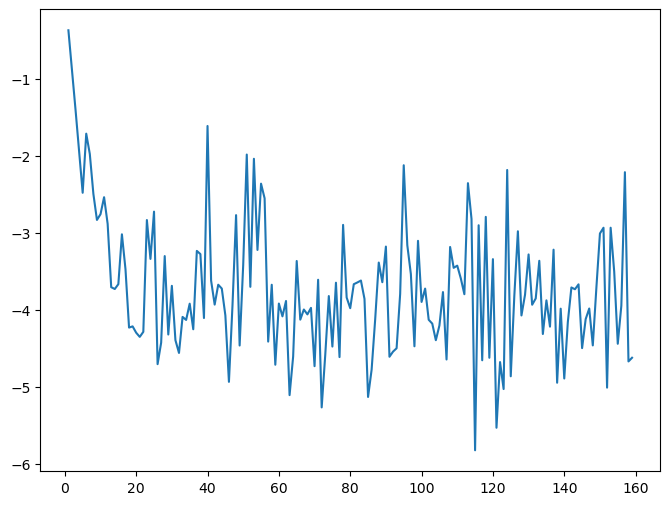

In [343]:
plt.figure(figsize=(8,6))
plt.plot(loss)

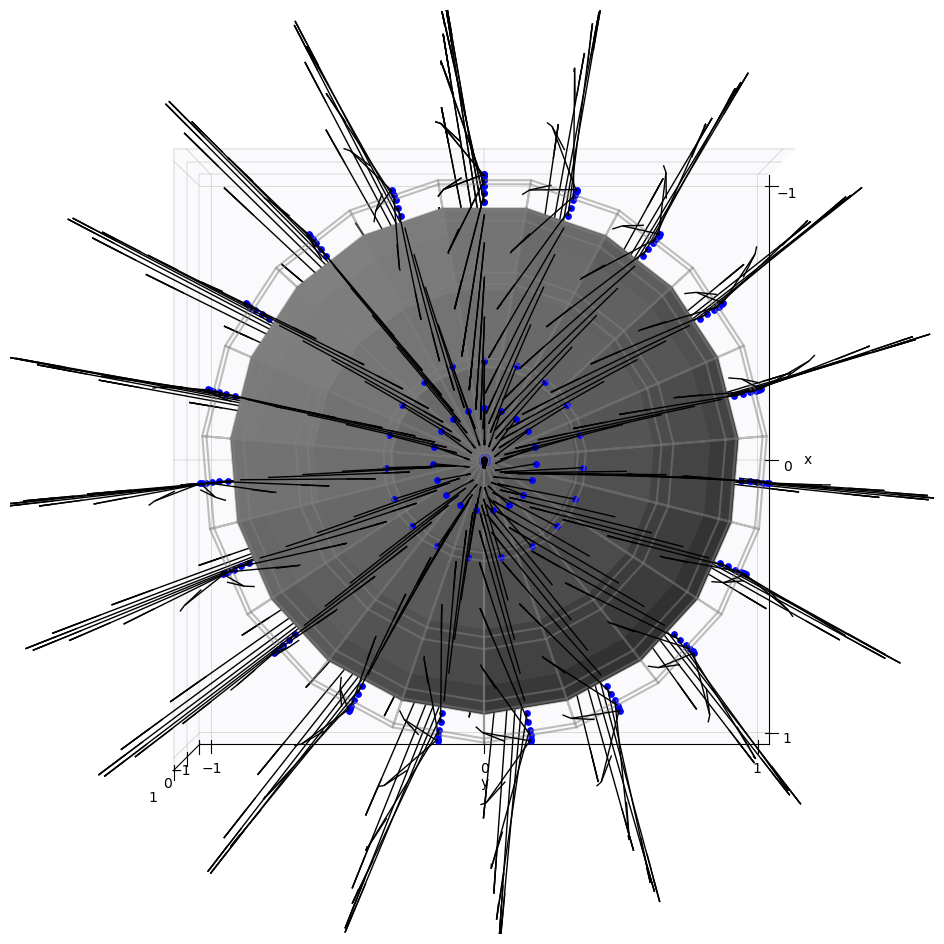

In [344]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,Fx)),pts=20)

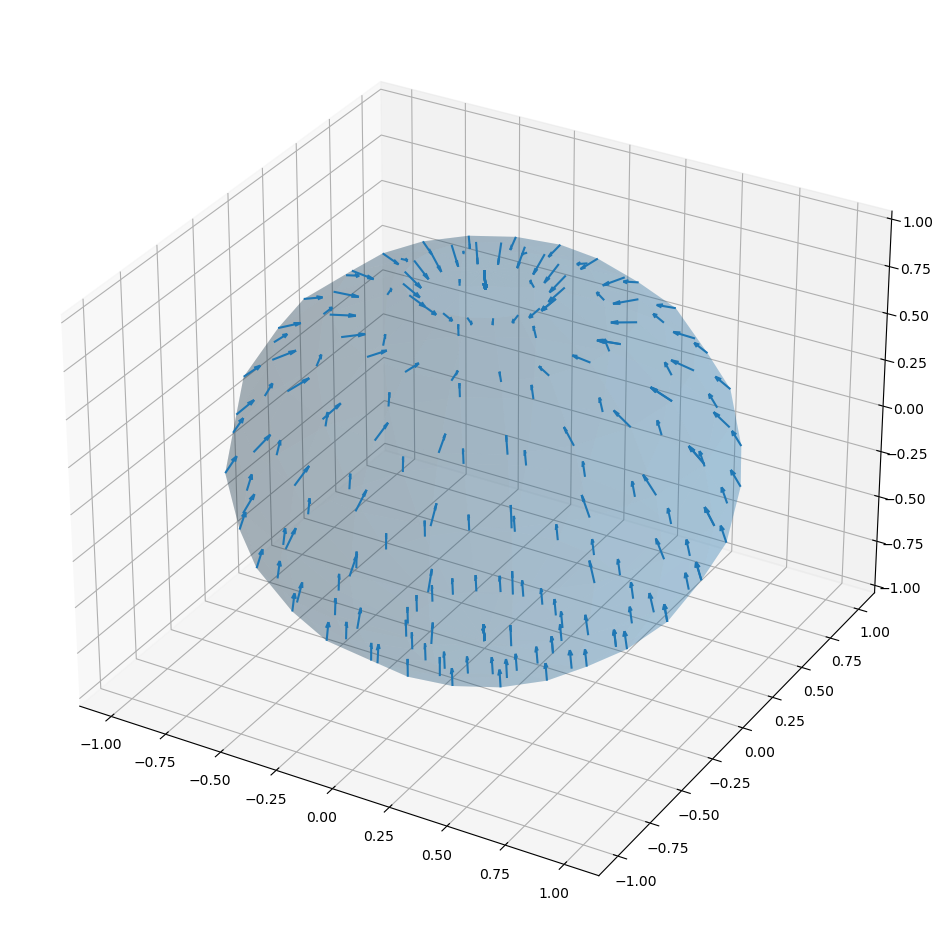

In [345]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,x2))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,x2)))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

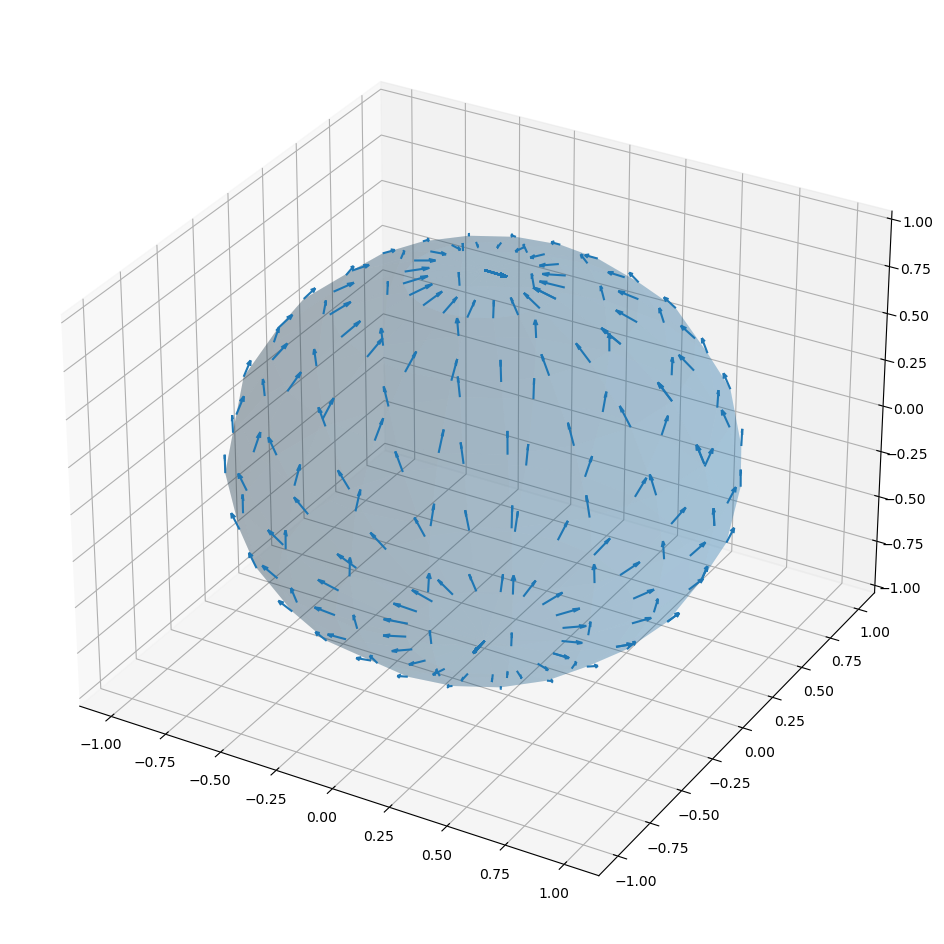

In [346]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

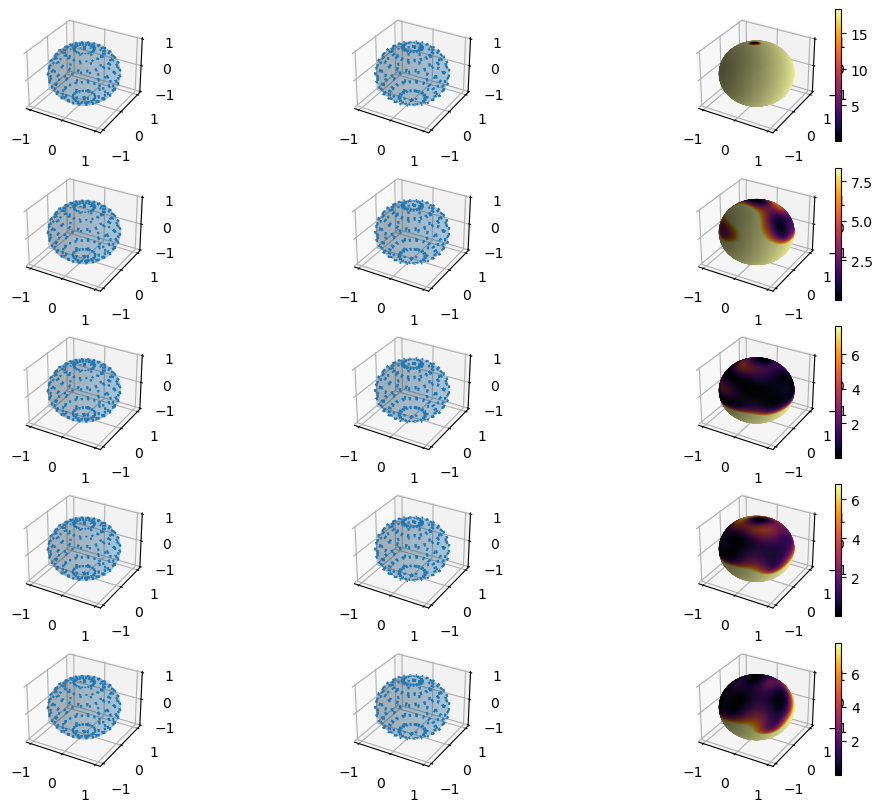

In [347]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,x2))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,x2)))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],Fx))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,Fx))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $T$

In [356]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
repeats = 2**3
batch_size = samples_per_x0*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [357]:
global x0s
x0s = tile(x0,batch_size)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = batch_size
        _dts = dts(T=T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        samples = xss[-1]
        charts = chartss[-1]
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (jnp.repeat(samples[::samples_per_x0],samples_per_x0,axis=0),
               jnp.repeat(charts[::samples_per_x0],samples_per_x0,axis=0))
        yield jnp.hstack((Fx0s,
                          jax.vmap(lambda x,chart: M.F((x,chart)))(samples,charts)))

In [358]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(40), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(10), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
#     y = jnp.squeeze(jax.vmap(to_TM)(x.reshape([-1,2*M.emb_dim])[:,M.emb_dim:],model(x.reshape([-1,2*M.emb_dim]))))
    y = model(x)
    return y

In [359]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params,data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:]
    (xts,chartts) = jax.vmap(get_coords)(Fxts)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda Fx0,xt,chartt: M.div((xt,chartt),
                                                lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                  net.apply(params,jnp.hstack((Fx0,M.F(x))))))
                   )(Fx0s,xts,chartts)
    return jnp.mean(norm2s+2.0*divs)

In [360]:
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.sgd(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: 0.694.
[Step 20], epoch 1, training loss: 0.507.
[Step 30], epoch 1, training loss: 0.418.
[Step 40], epoch 2, training loss: 0.395.
[Step 50], epoch 3, training loss: 0.265.
[Step 60], epoch 3, training loss: 0.251.
[Step 70], epoch 4, training loss: 0.010.
[Step 80], epoch 5, training loss: 0.090.
[Step 90], epoch 5, training loss: -0.051.
[Step 100], epoch 6, training loss: -0.098.
[Step 110], epoch 6, training loss: -0.178.
[Step 120], epoch 7, training loss: -0.276.
[Step 130], epoch 8, training loss: -0.398.
[Step 140], epoch 8, training loss: -0.474.
[Step 150], epoch 9, training loss: -0.331.
[Step 160], epoch 10, training loss: -0.461.
[Step 170], epoch 10, training loss: -0.445.
[Step 180], epoch 11, training loss: -0.512.
[Step 190], epoch 11, training loss: -0.629.
[Step 200], epoch 12, training loss: -0.752.
[Step 210], epoch 13, training loss: -0.743.
[Step 220], epoch 13, training loss: -0.789.
[St

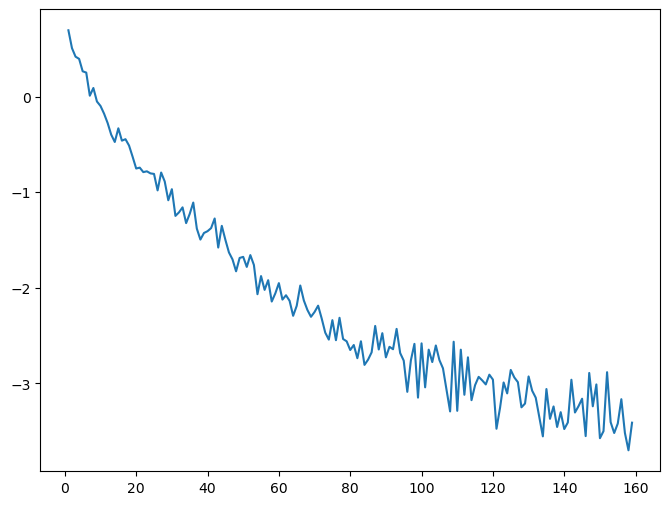

In [361]:
plt.figure(figsize=(8,6))
plt.plot(loss)

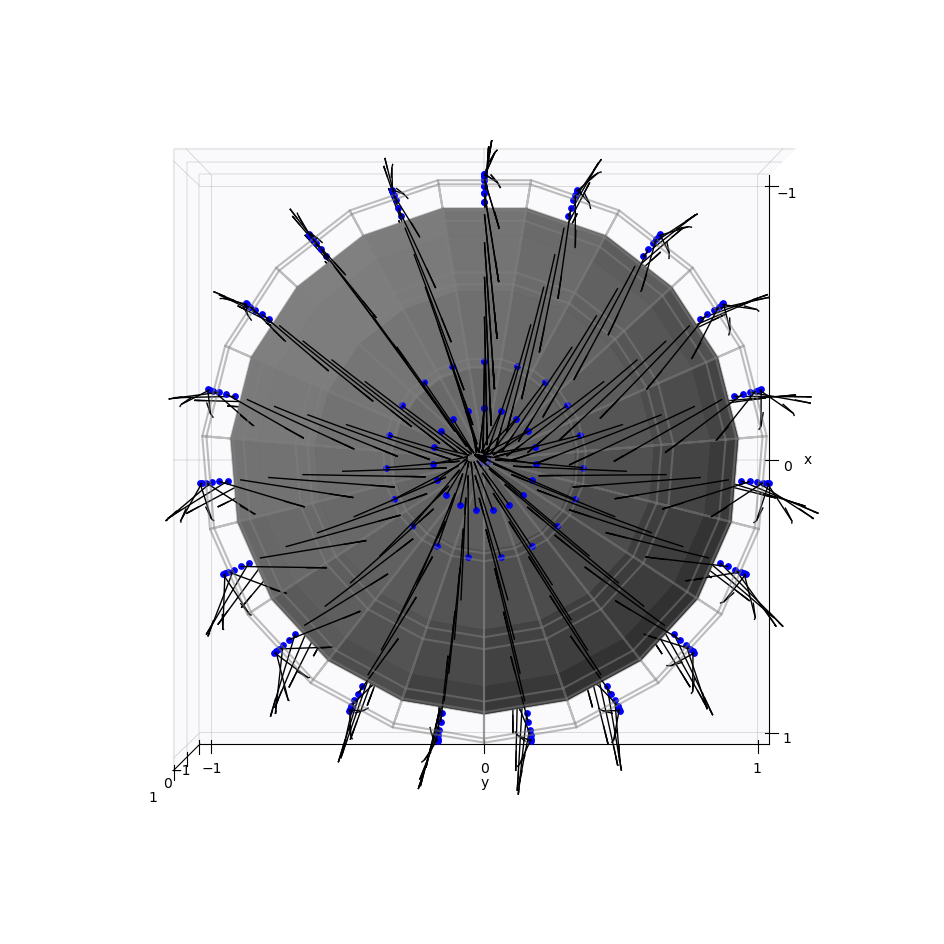

In [362]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx)))),pts=20)

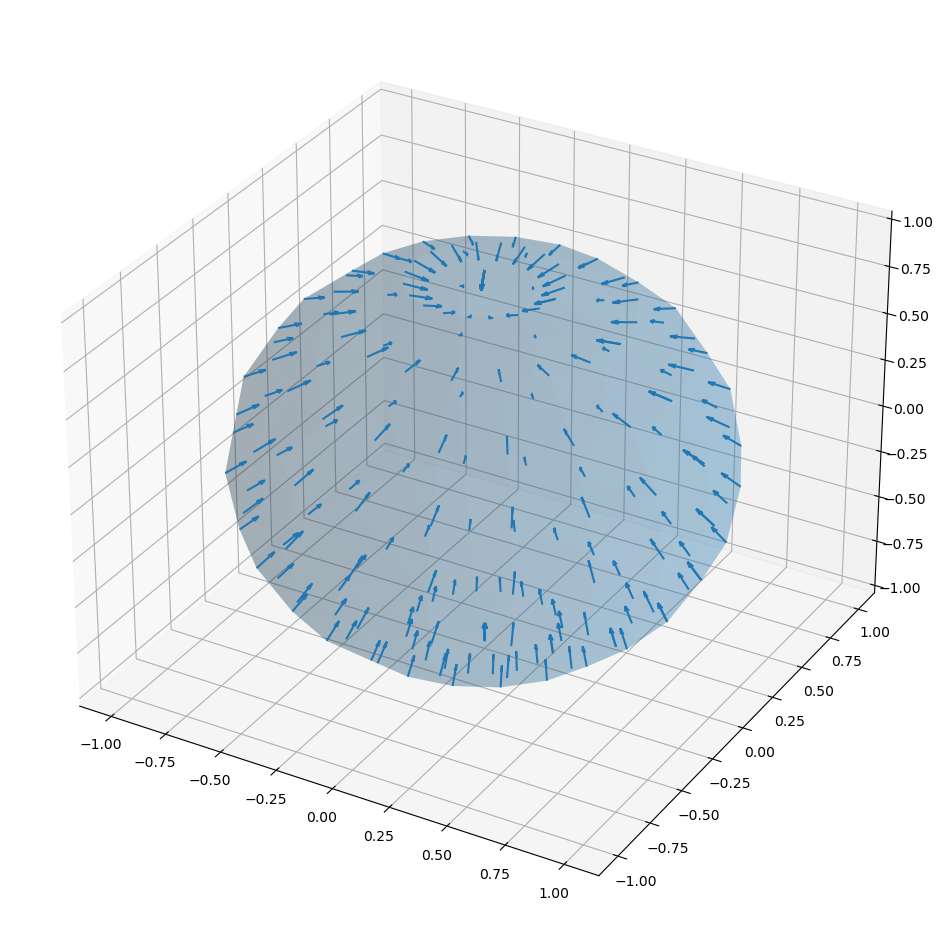

In [363]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2))))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2)))))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

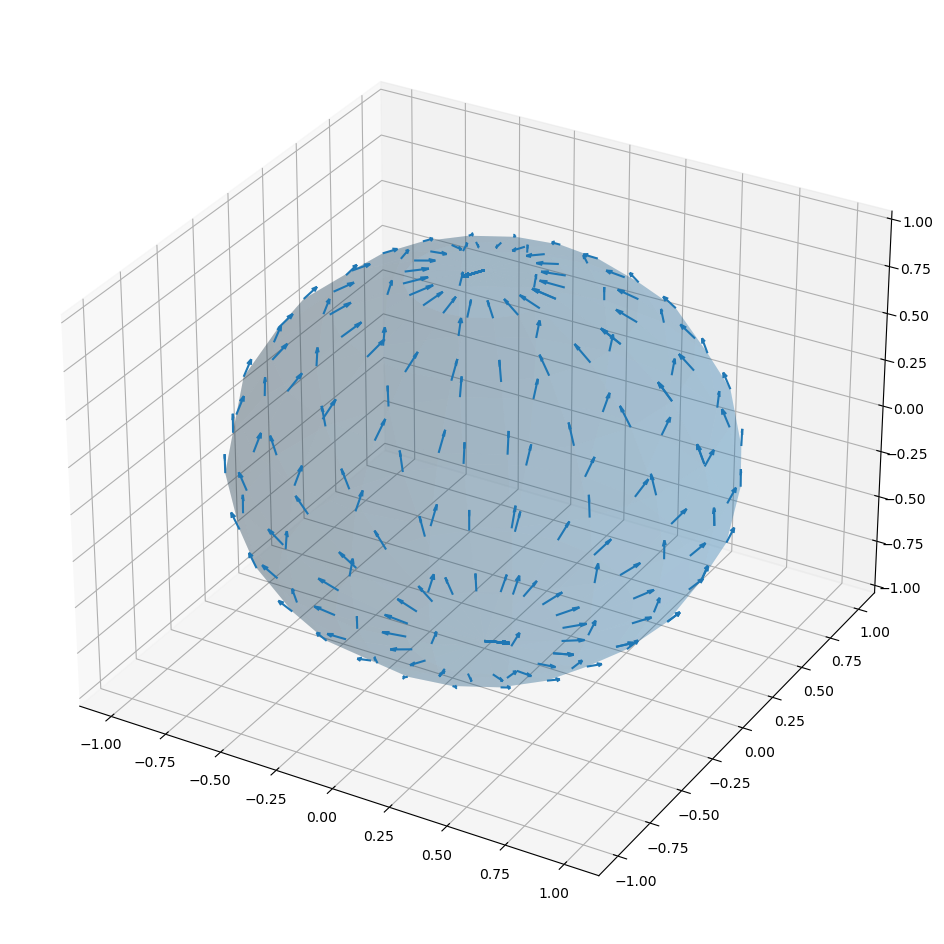

In [364]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

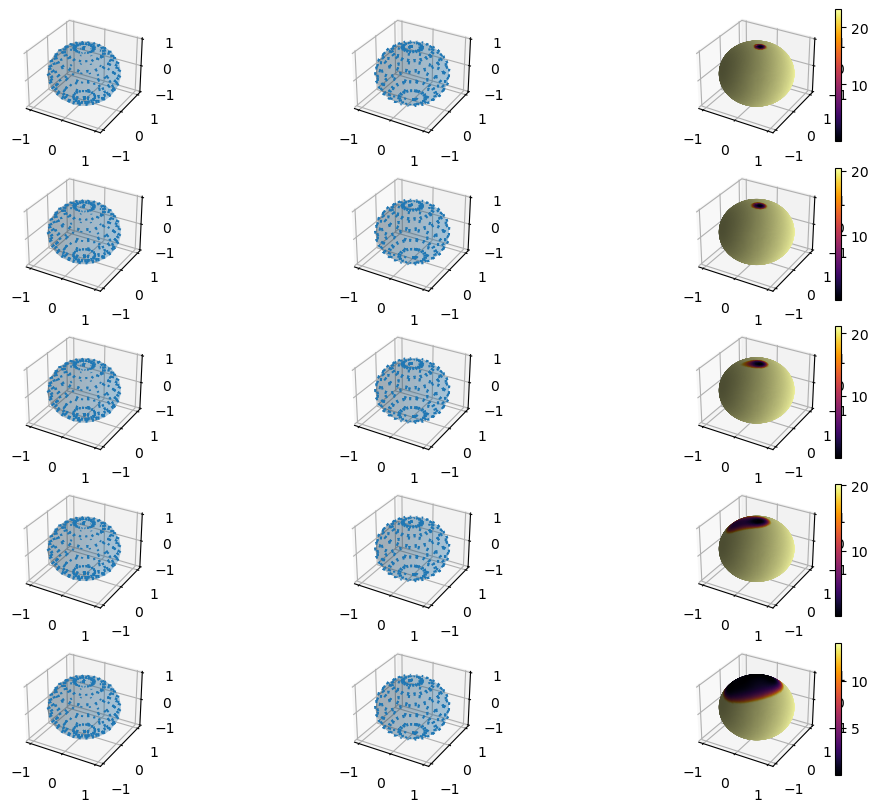

In [365]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2))))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2)))))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],jnp.hstack((M.F(x0),Fx))))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx))))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ for fixed $x_{0}$

In [378]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
ts_per_batch = 2**4
repeats = 2**5
batch_size = ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [379]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = repeats
        _dts = dts(T=max_T)
        global x0s
        (ts,xss,chartss,*_) = product(x0s,_dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))        
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([49,99])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts.reshape((-1,1)),N,axis=1).reshape((-1,1))
                        ))

In [380]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(30), jax.nn.tanh,
        hk.Linear(20), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    y = model(x)
    return y

In [381]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params,data)
    Fxts = data[:,0:M.emb_dim]
    ts = data[:,-1]
    (xts,chartts) = jax.vmap(get_coords)(Fxts)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda xt,chartt,t: M.div((xt,chartt),
                                              lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                net.apply(params,jnp.hstack((M.F(x),t)))))
                   )(xts,chartts,ts)
    return jnp.mean(norm2s+2.0*divs)

In [382]:
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: -0.626.
[Step 20], epoch 1, training loss: -1.289.
[Step 30], epoch 1, training loss: -1.732.
[Step 40], epoch 2, training loss: -1.681.
[Step 50], epoch 3, training loss: -2.157.
[Step 60], epoch 3, training loss: -2.785.
[Step 70], epoch 4, training loss: -2.336.
[Step 80], epoch 5, training loss: -3.949.
[Step 90], epoch 5, training loss: -3.530.
[Step 100], epoch 6, training loss: -3.523.
[Step 110], epoch 6, training loss: -4.403.
[Step 120], epoch 7, training loss: -3.764.
[Step 130], epoch 8, training loss: -4.538.
[Step 140], epoch 8, training loss: -4.522.
[Step 150], epoch 9, training loss: -3.297.
[Step 160], epoch 10, training loss: -2.982.
[Step 170], epoch 10, training loss: -3.500.
[Step 180], epoch 11, training loss: -3.315.
[Step 190], epoch 11, training loss: -3.875.
[Step 200], epoch 12, training loss: -3.735.
[Step 210], epoch 13, training loss: -4.094.
[Step 220], epoch 13, training loss: -4.

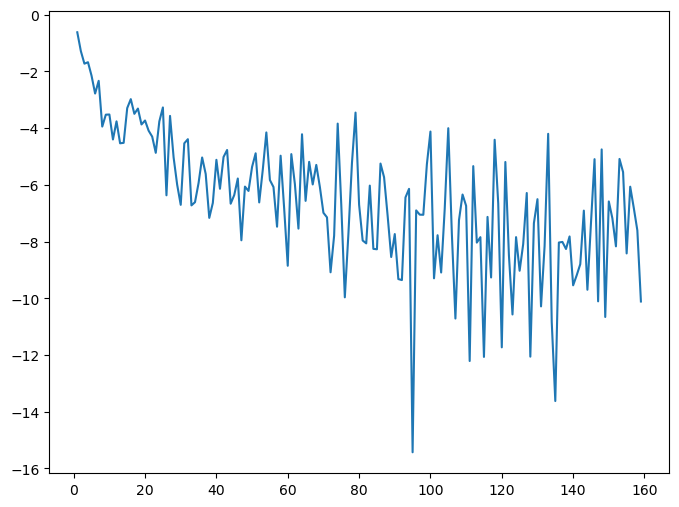

In [383]:
plt.figure(figsize=(8,6))
plt.plot(loss)

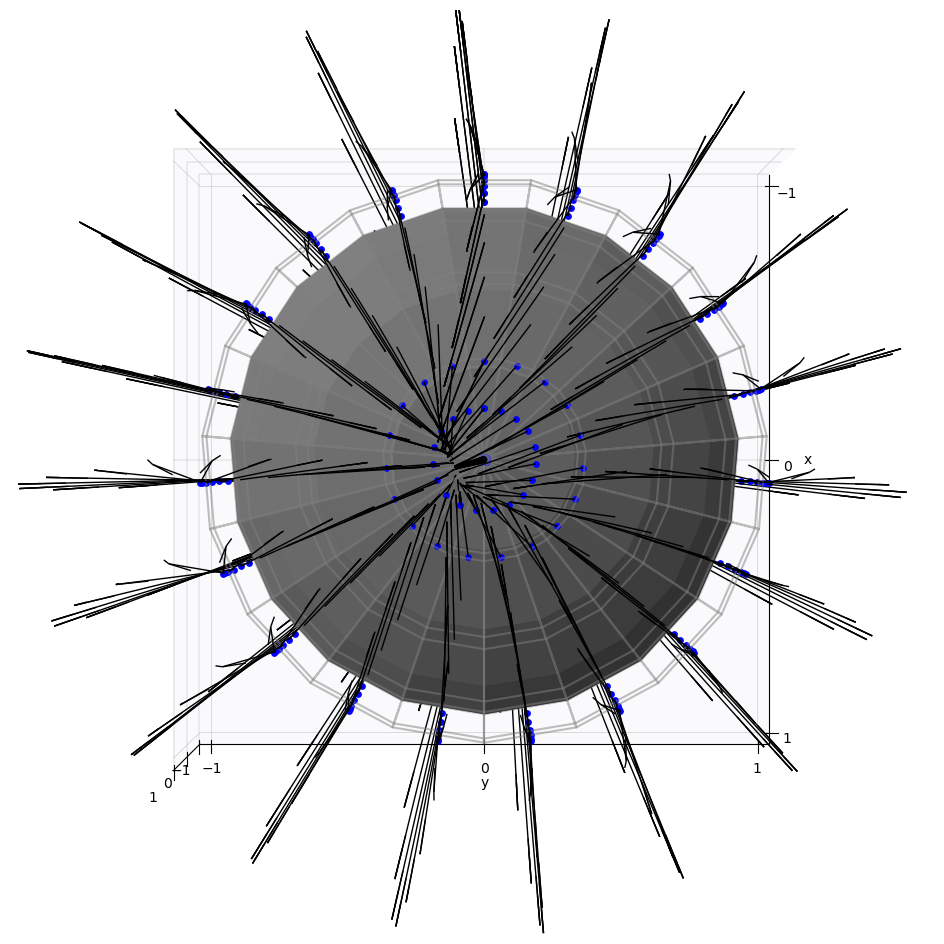

In [385]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((Fx, T)))),pts=20)

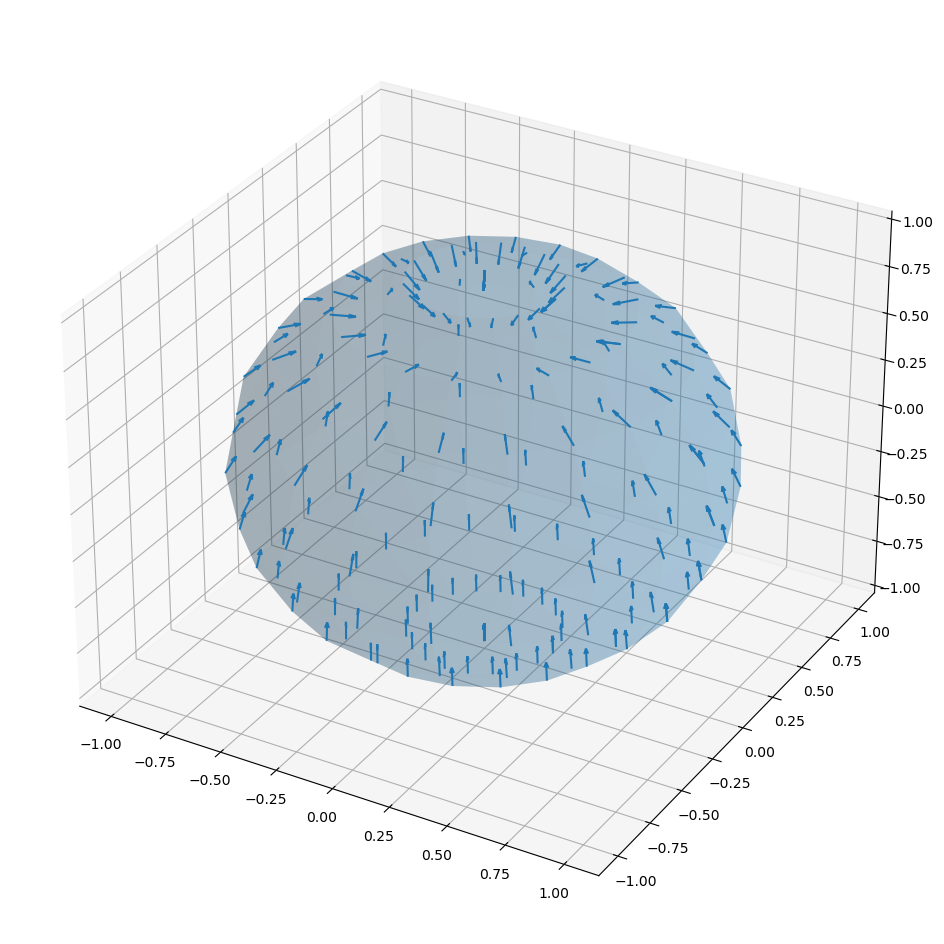

In [387]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((x2, T))))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((x2, T)))))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

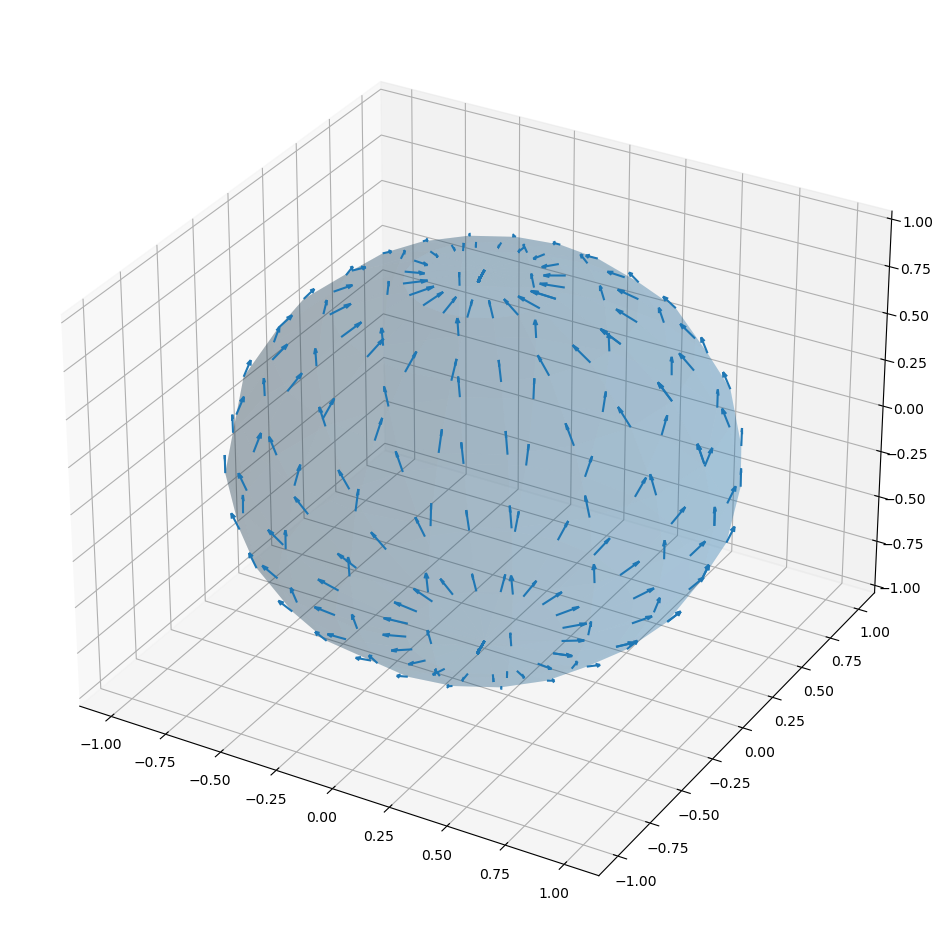

In [388]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

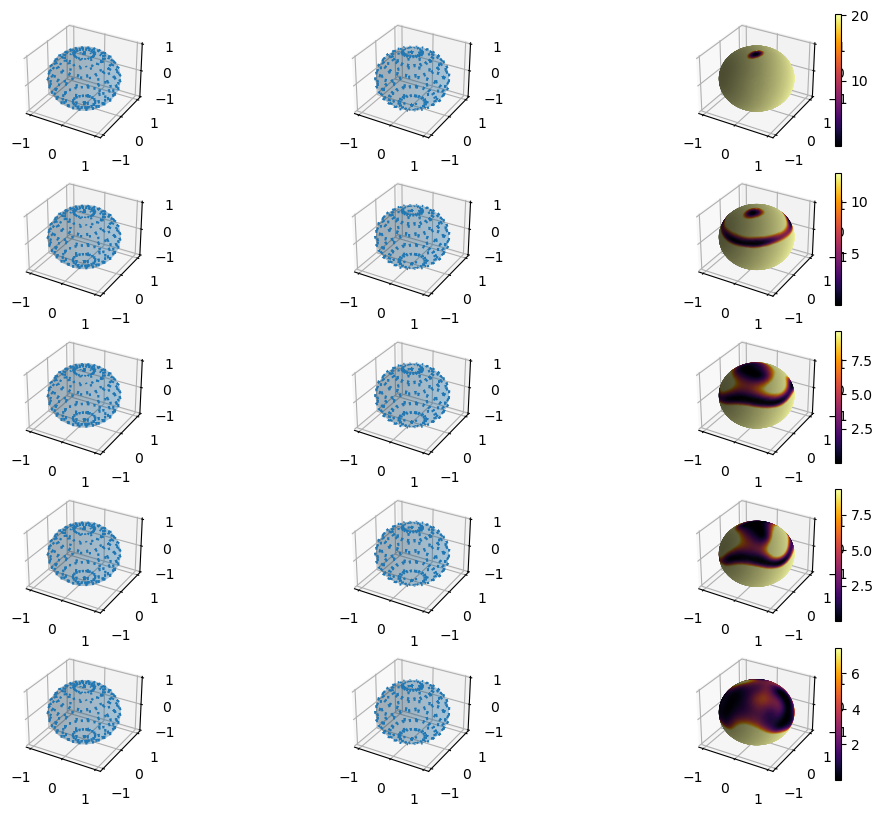

In [390]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((x2, T))))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((x2, T)))))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],jnp.hstack((Fx, T))))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((Fx, T))))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

### Learning $\nabla_{x}\log p$ in general

In [391]:
#Hyper parameters
learning_rate = 0.001 # Learning rate for optimizer
epochs = 100 # Number of passes over the dataset
samples_per_x0 = 2**5
ts_per_batch = 2**7
repeats = 2**3
batch_size = samples_per_x0*ts_per_batch*repeats
samples_size = batch_size*2**4 # Total number of samples per epoch
maxiter = epochs * samples_size // batch_size

In [396]:
global x0s
x0s = tile(x0,repeats)

def generator_bm():
    while True:
        """Generates batches of samples."""
        N = samples_per_x0*repeats
        _dts = dts(T=max_T, n_steps=1000)
        global x0s
        (ts,xss,chartss,*_) = product((jnp.repeat(x0s[0],samples_per_x0,axis=0),jnp.repeat(x0s[1],samples_per_x0,axis=0)),
                                      _dts,dWs(N*M.dim,_dts).reshape(-1,N,M.dim),jnp.repeat(1.,N))
        Fx0s = jax.vmap(lambda x,chart: M.F((x,chart)))(*x0s)
        x0s = (xss[-1,::samples_per_x0],chartss[-1,::samples_per_x0])
        inds = np.random.choice(range(_dts.shape[0]),ts_per_batch,replace=False)
#         inds = jnp.arange(0,ts.shape[0]+1,ts.shape[0]//ts_per_batch)[1:]-1
#         inds = jnp.array([-1,-1])
        ts = ts[inds]
        samples = xss[inds]
        charts = chartss[inds]
        yield jnp.hstack((jnp.tile(jnp.repeat(Fx0s,samples_per_x0,axis=0),(ts_per_batch,1)),
                         jax.vmap(lambda x,chart: M.F((x,chart)))(samples.reshape((-1,M.dim)),charts.reshape((-1,chartss.shape[-1]))),
                         jnp.repeat(ts,N).reshape((-1,1))
                        ))

In [397]:
#Network
def net_f(x):
    """Create model."""
    model = hk.Sequential([
        hk.Linear(400), jax.nn.tanh,
        hk.Linear(200), jax.nn.tanh,
        hk.Linear(100), jax.nn.tanh,
        hk.Linear(50), jax.nn.tanh,
        hk.Linear(M.emb_dim),
    ])
    
    y = model(x)
    
    return y

In [398]:
#Loss function
def loss_fun(params, data):
    """ compute loss."""
    s = net.apply(params,data)
    Fx0s = data[:,0:M.emb_dim]
    Fxts = data[:,M.emb_dim:2*M.emb_dim]
    ts = data[:,-1]
    (xts,chartts) = jax.vmap(get_coords)(Fxts)
    norm2s = jax.vmap(lambda s: jnp.sum(jnp.square(s)))(s)
    divs = jax.vmap(lambda Fx0,xt,chartt,t: M.div((xt,chartt),
                                                  lambda x: jnp.dot(M.invJF((M.F(x),x[1])),
                                                                    net.apply(params,jnp.hstack((Fx0,M.F(x),t)))))
                   )(Fx0s,xts,chartts,ts)
    return jnp.mean(norm2s+2.0*divs)

In [399]:
generator = generator_bm
ds = tf.data.Dataset.from_generator(generator,output_types=tf.float32,output_shapes=([batch_size,2*M.emb_dim+1]))
ds = iter(tfds.as_numpy(ds))

# initialize net and parameters
net = hk.without_apply_rng(hk.transform(net_f))
params = net.init(jax.random.PRNGKey(42), next(ds))

# Initialize solver.
params_lst = []
loss = []
def pre_update(params,state,*ars,**kwargs):
    if state.iter_num % 10 == 0:
        loss.append(state.value)
        params_lst.append(params)
        print(f"[Step {state.iter_num}], epoch {state.iter_num//(samples_size//batch_size)}, training loss: {state.value:.3f}.")
    return params,state

opt = optax.adam(learning_rate)
solver = jaxopt.OptaxSolver(opt=opt,fun=loss_fun,maxiter=maxiter,pre_update=pre_update)

# run training loop
state = solver.init_state(params)
params, state = solver.run_iterator(
    init_params=params, iterator=ds)


[Step 0], epoch 0, training loss: inf.
[Step 10], epoch 0, training loss: -3.988.
[Step 20], epoch 1, training loss: -4.038.
[Step 30], epoch 1, training loss: -4.256.
[Step 40], epoch 2, training loss: -5.476.
[Step 50], epoch 3, training loss: -6.363.
[Step 60], epoch 3, training loss: -6.345.
[Step 70], epoch 4, training loss: -6.667.
[Step 80], epoch 5, training loss: -9.534.
[Step 90], epoch 5, training loss: -9.361.
[Step 100], epoch 6, training loss: -7.083.
[Step 110], epoch 6, training loss: -7.575.
[Step 120], epoch 7, training loss: -9.096.
[Step 130], epoch 8, training loss: -9.038.
[Step 140], epoch 8, training loss: -9.391.
[Step 150], epoch 9, training loss: -8.790.
[Step 160], epoch 10, training loss: -10.309.
[Step 170], epoch 10, training loss: -7.640.
[Step 180], epoch 11, training loss: -6.477.
[Step 190], epoch 11, training loss: -9.699.
[Step 200], epoch 12, training loss: -9.218.
[Step 210], epoch 13, training loss: -9.831.
[Step 220], epoch 13, training loss: -1

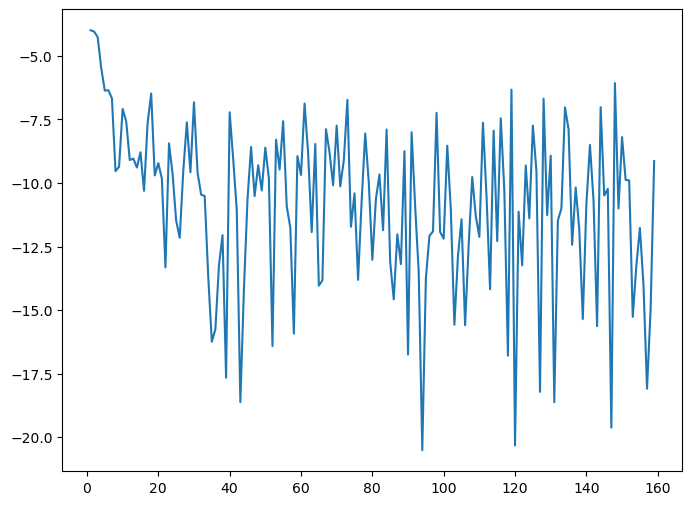

In [400]:
plt.figure(figsize=(8,6))
plt.plot(loss)

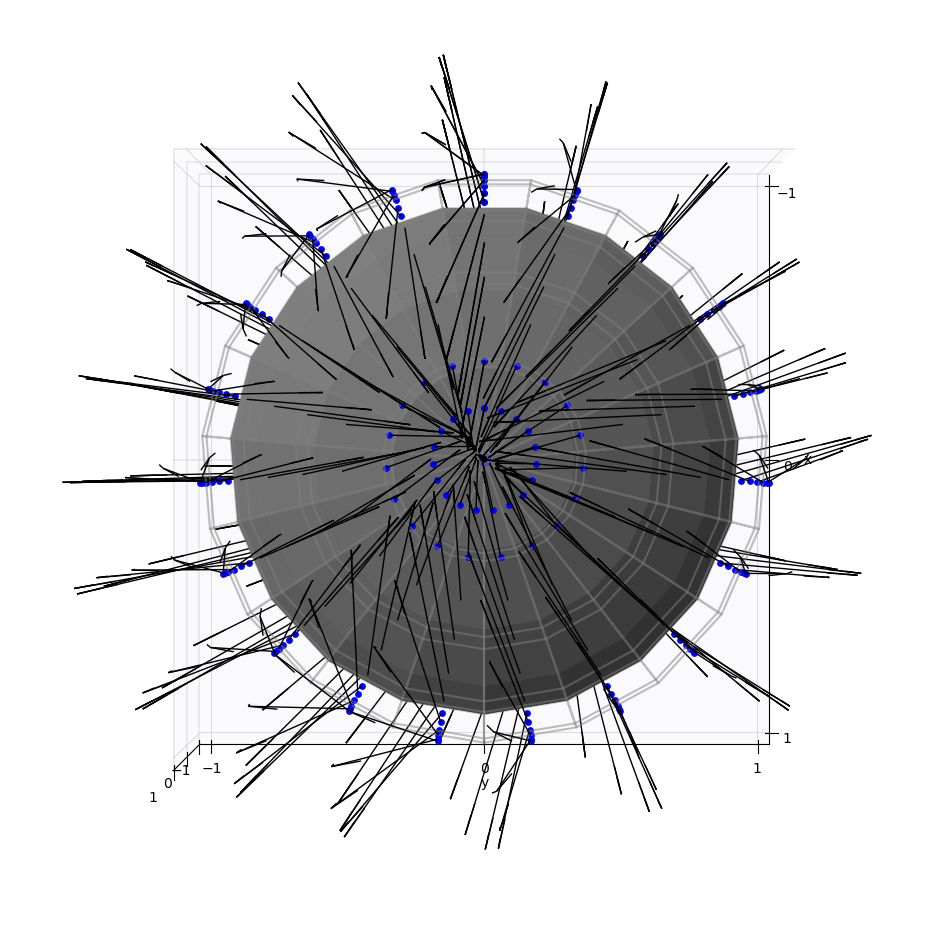

In [401]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx, T)))),pts=20)

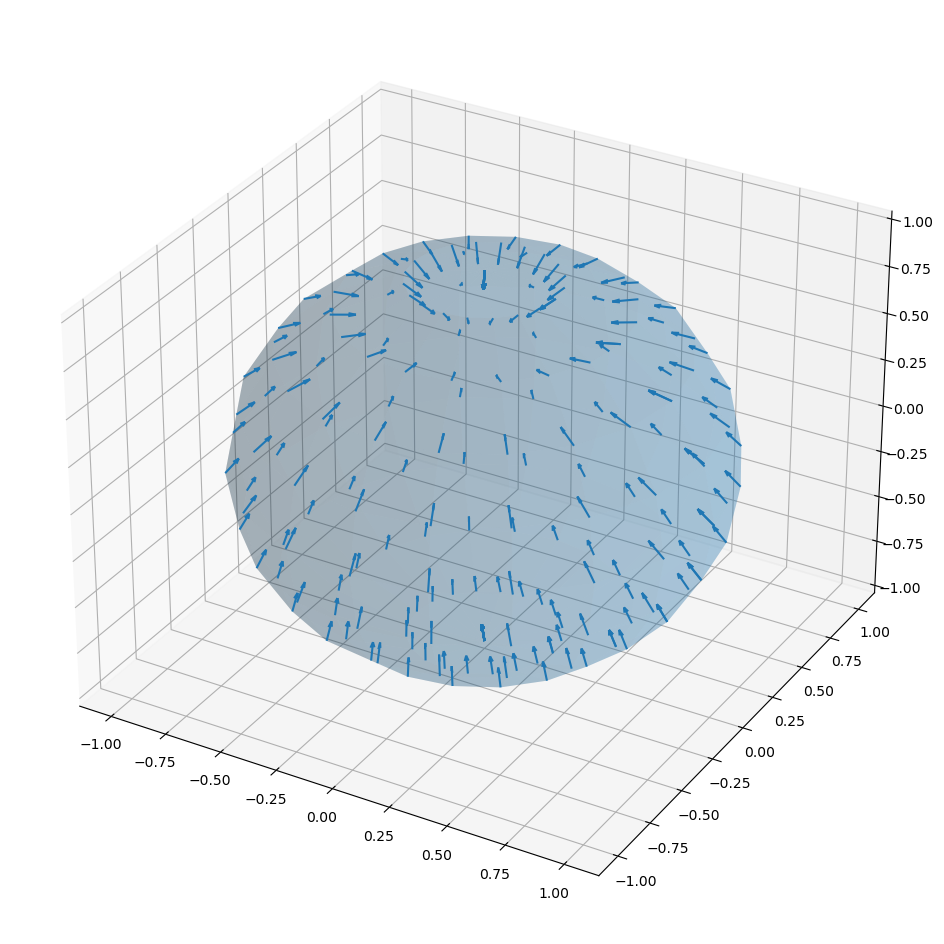

In [402]:
# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2, T))))(x1))(X)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2, T)))))(x1))(X)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

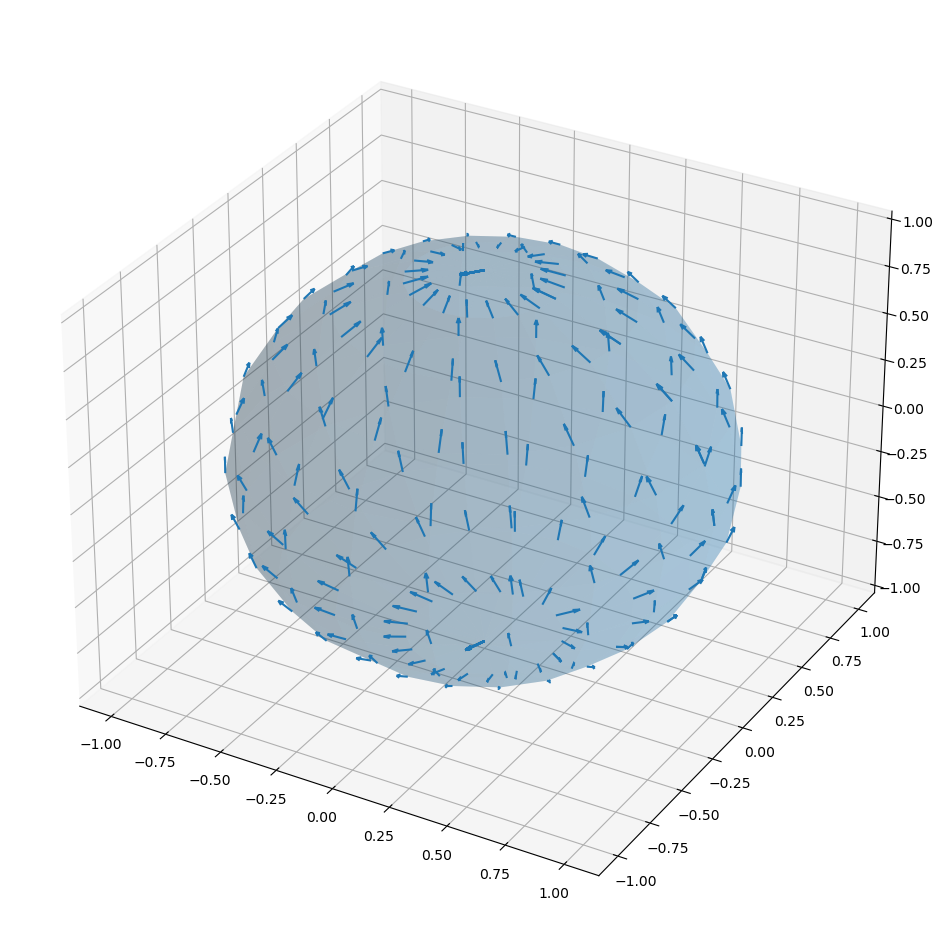

In [403]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1, X2, X3, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
plt.show()

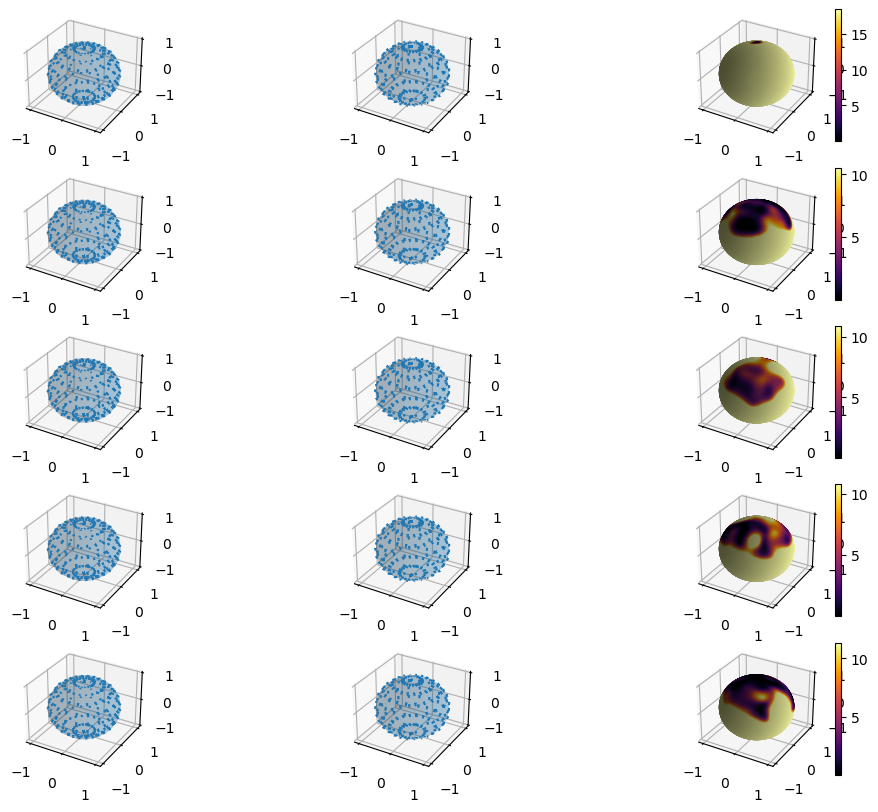

In [404]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

N_plots = 5

# Creating the theta and phi values.
intervals = 10
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_vec = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_vec = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_vec = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_vec = jnp.transpose(jnp.concatenate((X1_vec.reshape(1, ntheta+1, nphi+1), 
                     X2_vec.reshape(1, ntheta+1, nphi+1), 
                     X3_vec.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

grad_log = vmap(lambda x1: vmap(lambda x2: net.apply(params,jnp.hstack((M.F(x0),x2, T))))(x1))(X_vec)
TM_grad_log = vmap(lambda x1: vmap(lambda x2: to_TM(x2,net.apply(params,jnp.hstack((M.F(x0),x2, T)))))(x1))(X_vec)

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1_heat = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2_heat = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3_heat = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X_heat = jnp.transpose(jnp.concatenate((X1_heat.reshape(1, ntheta+1, nphi+1), 
                     X2_heat.reshape(1, ntheta+1, nphi+1), 
                     X3_heat.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))

# Creating the plot.
#fig, ax = plt.subplots(1,3)
fig = plt.figure(figsize=(12,12))
frac = int(len(params_lst)/N_plots)
for i in range(0,N_plots-1):
    numerical_grad = lambda Fx: to_TM(Fx,net.apply(params_lst[i*frac],jnp.hstack((M.F(x0),Fx, T))))
    heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+1, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+2, projection='3d')
    ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
    ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
    ax = fig.add_subplot(N_plots+1, 3, 3*i+3, projection='3d')
    ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
    m.set_array(heat_map)
    fig.colorbar(m, ax=ax)
numerical_grad = lambda Fx: to_TM(Fx,net.apply(params,jnp.hstack((M.F(x0),Fx, T))))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X_heat)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+1, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, grad_log[:,:,0], grad_log[:,:,1], grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+2, projection='3d')
ax.plot_surface(X1_vec, X2_vec, X3_vec, rstride=1, cstride=1, alpha=0.2)
ax.quiver(X1_vec, X2_vec, X3_vec, TM_grad_log[:,:,0], TM_grad_log[:,:,1], TM_grad_log[:,:,2], length=0.1, normalize=True)
ax = fig.add_subplot(N_plots+1, 3, 3*(N_plots-1)+3, projection='3d')
ax.plot_surface(X1_heat, X2_heat, X3_heat, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
fig.colorbar(m, ax=ax)

## Appendix

### Testing of theoretical heat kernel implementation

The below compares the implementation of the heat kernel in JAX with in-build libaries in scipy and numpy

In [255]:
import numpy as np
from scipy.special import gegenbauer, gamma

def r_sphere(theta, phi, rho=1.0):
    
    cos_theta = np.cos(theta)
    sin_theta = np.sin(theta)
    
    cos_phi = np.cos(phi)
    sin_phi = np.sin(phi)
    
    return rho*np.array([cos_theta*sin_phi, sin_theta*sin_phi, cos_phi])

def pm_test(x, y, t, m=2, N=20):
    
    val = 0.0
    xy_dot = np.dot(x,y)
    Am_inv = gamma((m+1)*0.5)/(2*np.pi**((m+1)*0.5))
    for l in range(N):
        val += np.exp(-l*(l+m-1)*t*0.5)*(2*l+m-1)*gegenbauer(l, (m-1)*0.5, monic=False)(xy_dot)/(m-1)
        
    return val*Am_inv

def gradlog_pm_test(x, y, t, m=2, N=20):
    
    val = 0.0
    xy_dot = np.dot(x,y)
    Am_inv = gamma((m+1)*0.5)/(2*np.pi**((m+1)*0.5))
    for l in range(1,N):
        val += x*np.exp(-l*(l+m-1)*t*0.5)*(2*l+m-1)*gegenbauer(l-1, (m+1)*0.5, monic=False)(xy_dot)
        
    return val*Am_inv/pm_test(x,y,t,m,N)

print(pm_test(x0[-1], jnp.array([0.0, 1.0, 0.0]), 0.5, N=20))
print(pm_test(x0[-1], jnp.array([0.0, -1.0, 0.0]), 0.5, N=20))

print(p_sm(x0[-1], jnp.array([0.0, 1.0, 0.0]), 0.5))
print(p_sm(x0[-1], jnp.array([0.0, -1.0, 0.0]), 0.5))


print(gradlog_pm_test(x0[-1], jnp.array([0.0, 1.0, 0.0]), T, N=20))
print(gradlog_pm_test(x0[-1], jnp.array([0.0, -1.0, 0.0]), T, N=20))

print(grad_log_p_sm(x0[-1], jnp.array([0.0, 1.0, 0.0]), T))
print(grad_log_p_sm(x0[-1], jnp.array([0.0, -1.0, 0.0]), T))
    
    

0.03698787732584918
0.03698787732584918
0.036716532
0.036716532
[0.        0.        2.8145401]
[0.        0.        2.8145401]
[0.        0.        2.8145409]
[0.        0.        2.8145409]


Below is the gradient computed using JAX's jacfwd

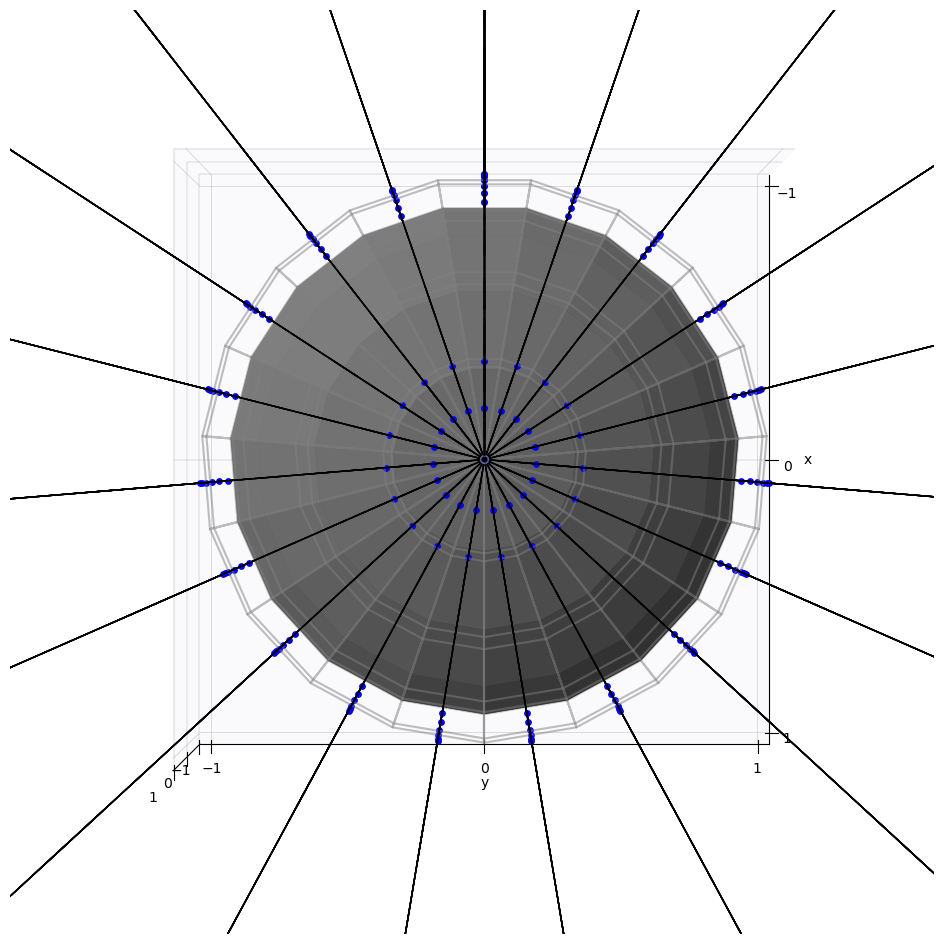

In [259]:
%matplotlib inline
newfig()
M.plot(alpha=1.,scale=.9,rotate=(90,0))
plot_sphere_f(M,lambda Fx: to_TM(Fx, jacfwd(lambda y: jnp.log(p_sm(x0[-1], y, T, N=20)))(Fx)),pts=20)

The error between the numerical estimation of the gradient using JAX and the theoretical

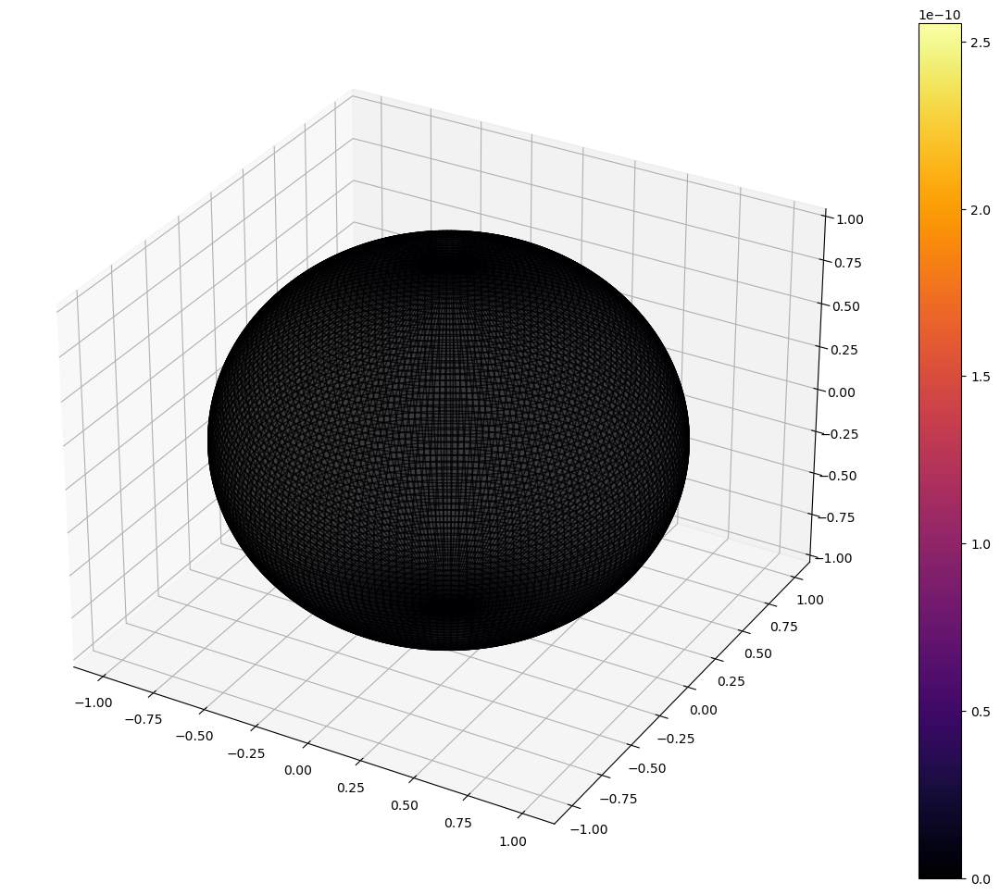

In [261]:
#Plot source: https://stackoverflow.com/questions/44594011/heat-map-on-unit-sphere

# Creating the theta and phi values.
intervals = 100
ntheta = intervals
nphi = 2*intervals

theta = jnp.linspace(0.0, jnp.pi*1, ntheta+1)
phi   = jnp.linspace(0.0, jnp.pi*2, nphi+1)

# Creating the coordinate grid for the unit sphere.
X1 = jnp.outer(jnp.sin(theta), jnp.cos(phi))
X2 = jnp.outer(jnp.sin(theta), jnp.sin(phi))
X3 = jnp.outer(jnp.cos(theta), jnp.ones(nphi+1))
X = jnp.transpose(jnp.concatenate((X1.reshape(1, ntheta+1, nphi+1), 
                     X2.reshape(1, ntheta+1, nphi+1), 
                     X3.reshape(1, ntheta+1, nphi+1))), axes=(1,2,0))

theoretical_grad = lambda Fx: to_TM(Fx,grad_log_p_sm(x0[-1], Fx, T))
numerical_grad = lambda Fx: to_TM(Fx, jacfwd(lambda y: jnp.log(p_sm(x0[-1], y, T, N=20)))(Fx))
heat_map = vmap(lambda x2: vmap(lambda x1: jnp.sum((theoretical_grad(x1)-numerical_grad(x1))**2))(x2))(X)

# Creating the plot.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, X3, rstride=1, cstride=1, facecolors=plt.cm.inferno(heat_map*10), alpha=0.5)
m = mpl.cm.ScalarMappable(cmap=mpl.cm.inferno)
m.set_array(heat_map)
plt.colorbar(m)